# Biomass Estimation from Pasture Imagery 

The agricultural industry stands at a critical juncture where precision meets sustainability. Efficient pasture management is the backbone of productive livestock farming, yet accurately estimating biomass across vast, diverse landscapes remains a significant challenge.

To bridge this gap, we are developing a machine learning model designed to predict **pasture biomass** by integrating high-resolution imagery, ground-truth measurements, and publicly available datasets like **NDVI (Normalized Difference Vegetation Index)**. Using a professionally annotated dataset that spans Australian seasons, regions, and various species mixes, this project aims to transform raw data into actionable insights.

## Why This Matters

By improving the accuracy of biomass estimation, we provide the tools necessary for:

- **Smarter Grazing Choices:** Helping farmers optimize stocking rates and rotational grazing.
- **Enhanced Research:** Enabling scientists to track pasture health and carbon sequestration with higher precision.
- **Sustainable Productivity:** Driving the industry toward resilient agricultural systems that balance production with environmental stewardship.


## Evaluation Metric: Globally Weighted $R^2$

To ensure the model performs reliably across different pasture components (such as green vs. dead material), we use a **Globally Weighted Coefficient of Determination ($R_w^2$)**.   
This metric evaluates all (image, target) pairs together, applying specific weights to different target types to prioritize the most critical biomass indicators.

Instead of computing an $R^2$ per target and averaging, we **stack all targets into one evaluation set** and apply a **per-row weight** based on the target type:

| Target | Weight |
|---|---:|
| `Dry_Green_g`  | 0.1 |
| `Dry_Dead_g`   | 0.1 |
| `Dry_Clover_g` | 0.1 |
| `GDM_g`        | 0.2 |
| `Dry_Total_g`  | 0.5 |

This makes the final score prioritize the most important target(s) (especially `Dry_Total_g`) while still accounting for the others.

#### $R^2$ Calculation

The weighted coefficient of determination is:

$$
R_w^2 = 1 - \frac{\sum_j w_j \left(y_j - \hat{y}_j\right)^2}{\sum_j w_j \left(y_j - \bar{y}_w\right)^2}
$$

where the global weighted mean is:

$$
\bar{y}_w = \frac{\sum_j w_j y_j}{\sum_j w_j}
$$

#### Residual Sum of Squares ($SS_{res}$)

Measures the total weighted prediction error:

$$
SS_{res} = \sum_j w_j \left(y_j - \hat{y}_j\right)^2
$$

#### Total Sum of Squares ($SS_{tot}$)

Measures the total weighted variance in the ground truth:

$$
SS_{tot} = \sum_j w_j \left(y_j - \bar{y}_w\right)^2
$$

#### Terms

- $y_j$: ground-truth value for data point $j$
- $\hat{y}_j$: model prediction for data point $j$
- $w_j$: per-row weight based on target type
- $\bar{y}_w$: global weighted mean of all ground-truth values



## Data Analysis

In [54]:
import os
import pandas as pd

import importlib, shared_utils as su
importlib.reload(su)

pd.set_option('display.expand_frame_repr', False)  # don't split into blocks
pd.set_option('display.width', 200)               # or None for auto / very wide
pd.set_option('display.max_columns', None)        # show all columns

In [55]:
all_cols = ["sample_id", "Species", "Pre_GSHH_NDVI", "Height_Ave_cm",
        "Dry_Clover_g", "Dry_Dead_g",
        "Dry_Green_g", "Dry_Total_g", "GDM_g"]

# List all attached datasets
print(os.listdir("../data/csiro-biomass"))

['sample_submission.csv', 'train.csv', 'test.csv', 'csiro-biomass.zip', 'test', 'train']


## Overall Data

In [56]:
import os, cv2
import numpy as np
from sklearn.model_selection import train_test_split

def prepare_data(data_root, in_csv_fl):
    # ---------------------------------
    # Read the data from CSV
    train_df = pd.read_csv(f"{data_root}/{in_csv_fl}")
    # print(f"INPUT:\n{train_df}")

    cols_to_drop = ["State", "Sampling_Date", "image_path"]
    biomass_cols_order = ["Dry_Clover_g", "Dry_Dead_g", "Dry_Green_g", "Dry_Total_g", "GDM_g"]
        
    train_df = train_df.drop(columns=cols_to_drop)
    # print(train_df)

    # Change the sample_id to have just ID and nothing else
    train_df["sample_id"] = train_df["sample_id"].str.split("__").str[0]

    train_pivot = (
        train_df.pivot_table(
            index=["sample_id", "Species", "Pre_GSHH_NDVI", "Height_Ave_cm"],
            columns="target_name",
            values="target"
        ).reset_index()
    )

    train_pivot = train_pivot.rename_axis(columns=None)

    # ensure biomass columns are in a fixed order
    train_pivot = train_pivot [
        ["sample_id", "Species", "Pre_GSHH_NDVI", "Height_Ave_cm"] + biomass_cols_order
    ]

    return train_pivot.reset_index(drop=True)

In [57]:
data_root = "../data/csiro-biomass"
in_csv_fl="train.csv"

train_df = pd.read_csv(f"{data_root}/{in_csv_fl}")
print(train_df)

full_df = prepare_data(data_root=data_root, in_csv_fl=in_csv_fl)
print(full_df)

                       sample_id              image_path Sampling_Date State          Species  Pre_GSHH_NDVI  Height_Ave_cm   target_name   target
0     ID1011485656__Dry_Clover_g  train/ID1011485656.jpg      2015/9/4   Tas  Ryegrass_Clover           0.62         4.6667  Dry_Clover_g   0.0000
1       ID1011485656__Dry_Dead_g  train/ID1011485656.jpg      2015/9/4   Tas  Ryegrass_Clover           0.62         4.6667    Dry_Dead_g  31.9984
2      ID1011485656__Dry_Green_g  train/ID1011485656.jpg      2015/9/4   Tas  Ryegrass_Clover           0.62         4.6667   Dry_Green_g  16.2751
3      ID1011485656__Dry_Total_g  train/ID1011485656.jpg      2015/9/4   Tas  Ryegrass_Clover           0.62         4.6667   Dry_Total_g  48.2735
4            ID1011485656__GDM_g  train/ID1011485656.jpg      2015/9/4   Tas  Ryegrass_Clover           0.62         4.6667         GDM_g  16.2750
...                          ...                     ...           ...   ...              ...            ...          

## Visual Comparison of Pastures by Species

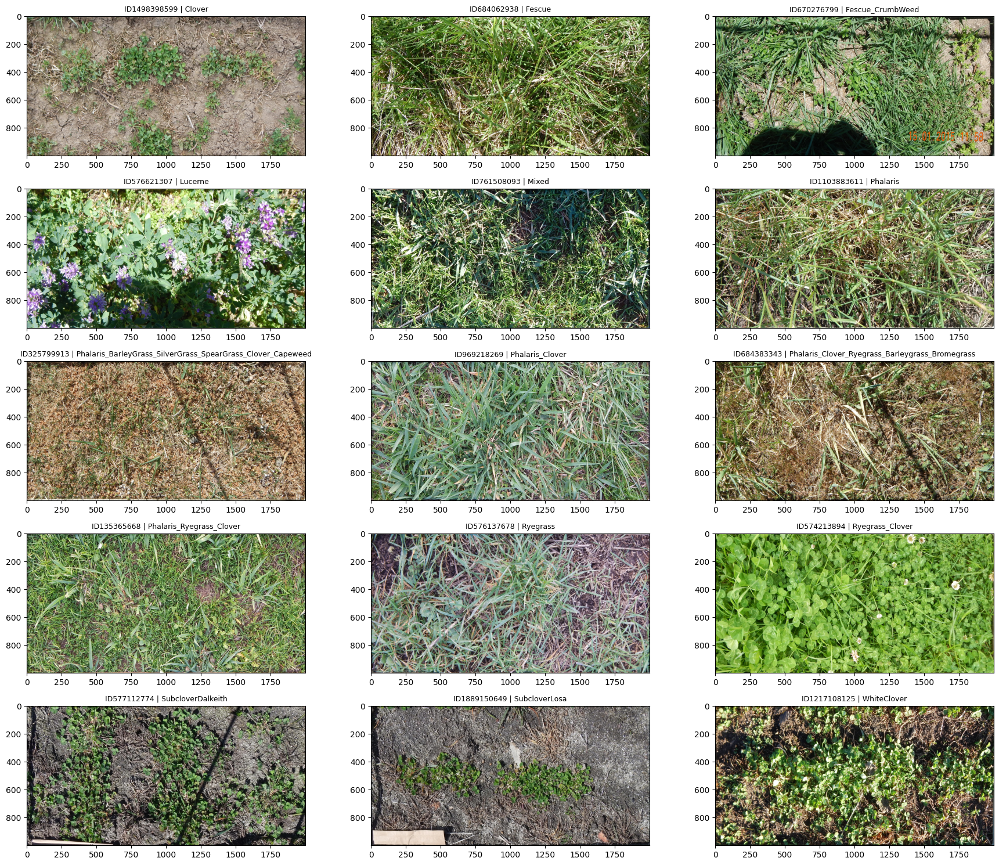

In [58]:
su.show_one_image_per_species(
    df=full_df,
    img_dir="../data/csiro-biomass/train",
    fig_w=18,
    max_species=30
)

## Distribution of Regression Targets and Inputs

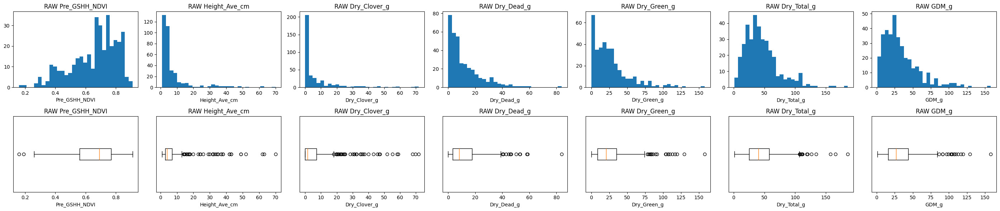

In [59]:
cols = ["Pre_GSHH_NDVI", "Height_Ave_cm",
        "Dry_Clover_g", "Dry_Dead_g",
        "Dry_Green_g", "Dry_Total_g", "GDM_g"]

su.plot_distributions(full_df, cols)

### Analysis of Inputs distribution

| Feature | Notes |
|---|---|
| Pre_GSHH_NDVI | • Values are bounded (roughly 0.2 → 0.9), so scaling is easy.<br>• Distribution is not uniform; more samples sit in the higher NDVI range.<br>• Looks mildly multimodal (multiple bumps), suggesting different field conditions / species mixes.<br>• Good candidate for standardization (mean/std) without needing log transforms. |
| Height_Ave_cm | • Strong right-skew: lots of small heights, few very large values.<br>• Many outliers (very tall samples), which can dominate MSE-type losses.<br>• Suggests using log1p(height) or robust scaling (median/IQR) or clipping extreme heights. |

### Analysis of Targets distribution

| Target | Notes |
|---|---|
| Dry_Clover_g | • Zero-heavy (many samples near 0) + long tail up to large values.<br>• Indicates sparse presence: clover often absent, sometimes abundant.<br>• Modeling clue: log1p target (or two-stage: presence/absence + regression) helps. |
| Dry_Dead_g | • Also right-skewed with noticeable spread and outliers.<br>• More “continuous” than clover but still long-tailed.<br>• Modeling clue: log1p + robust loss (Huber / MAE) reduces outlier impact. |
| Dry_Green_g | • Right-skewed with a long tail and several high outliers.<br>• Wide dynamic range suggests plain MSE will overweight large values.<br>• Modeling clue: log1p and/or relative-error-friendly loss (MAE/Huber). |
| Dry_Total_g | • Looks closer to a “bell-ish” shape than others, but still right-skewed with outliers.<br>• Being a total, it tends to be more stable than individual components.<br>• Modeling clue: still benefits from log1p, but may train more smoothly than parts. |
| GDM_g | • Right-skewed with long tail; resembles totals (often similar to Dry_Total_g behavior).<br>• A few large values can dominate training.<br>• Modeling clue: log1p + robust loss; consider clipping extreme labels for stability. |



## **NDVI (Pre_GSHH_NDVI)**

### NDVI (Pre_GSHH_NDVI) values distribution detailed analysis

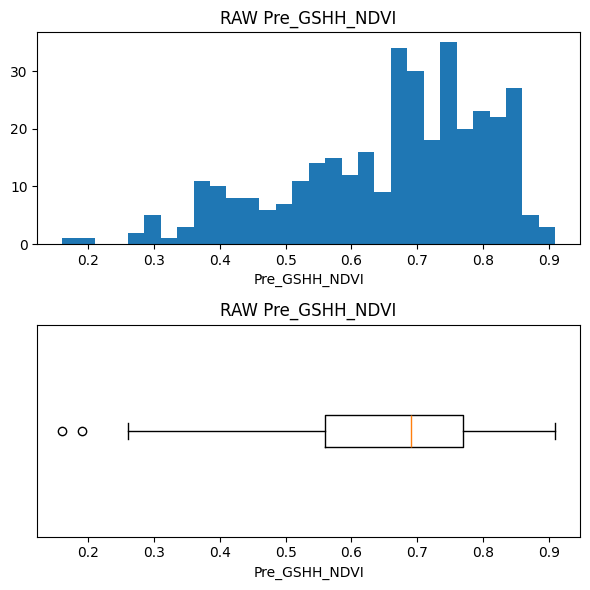

In [60]:
col_Dry_Clover_g = ["Pre_GSHH_NDVI"]
su.plot_distributions(full_df, col_Dry_Clover_g)

* **Most samples have high NDVI.**
  The histogram mass is mainly around **~0.65 to ~0.85**, which typically indicates **healthy/green vegetation** (more canopy/greenness).

* **There are a few very low-NDVI outliers.**
  The boxplot shows **2–3 points around ~0.15–0.2** far below the rest, likely **bare soil / shadows / dead vegetation / image/label issues / wrong ROI**. These are worth visually inspecting.

* **Central tendency is around ~0.7.**
  The median line in the boxplot is roughly **~0.70**.

* **Spread is moderate with a longer tail to the low side (left-skew / negative skew).**
  The left whisker is long (down to ~0.25-ish) compared to the right side. That means variability is mainly from occasional low NDVI samples.

* **No need for log1p on NDVI.**
  NDVI is already **bounded** (roughly $[-1, 1]$; here ~0.15–0.9) and not a “heavy-tailed positive” variable like biomass. Log transforms are usually for long-right-tail variables; this one doesn’t look like that.

Next steps:

* **Flag low NDVI** (e.g., `< 0.25`) and inspect those images/metadata.
* If they’re genuine cases, keep them; if they’re artifacts, you can **remove** or **cap** them, or treat them as a separate “bad capture” category.


### How NDVI (Pre_GSHH_NDVI) is related to targets ? Does this variable provide any signal ?

        sample_id            Species  Pre_GSHH_NDVI  Height_Ave_cm  Dry_Clover_g  Dry_Dead_g  Dry_Green_g  Dry_Total_g    GDM_g
0    ID1011485656    Ryegrass_Clover           0.62         4.6667        0.0000     31.9984      16.2751      48.2735  16.2750
1    ID1012260530            Lucerne           0.55        16.0000        0.0000      0.0000       7.6000       7.6000   7.6000
2    ID1025234388  SubcloverDalkeith           0.38         1.0000        6.0500      0.0000       0.0000       6.0500   6.0500
3    ID1028611175           Ryegrass           0.66         5.0000        0.0000     30.9703      24.2376      55.2079  24.2376
4    ID1035947949           Ryegrass           0.54         3.5000        0.4343     23.2239      10.5261      34.1844  10.9605
..            ...                ...            ...            ...           ...         ...          ...          ...      ...
352   ID975115267             Clover           0.73         3.0000       40.0300      0.0000       0.800

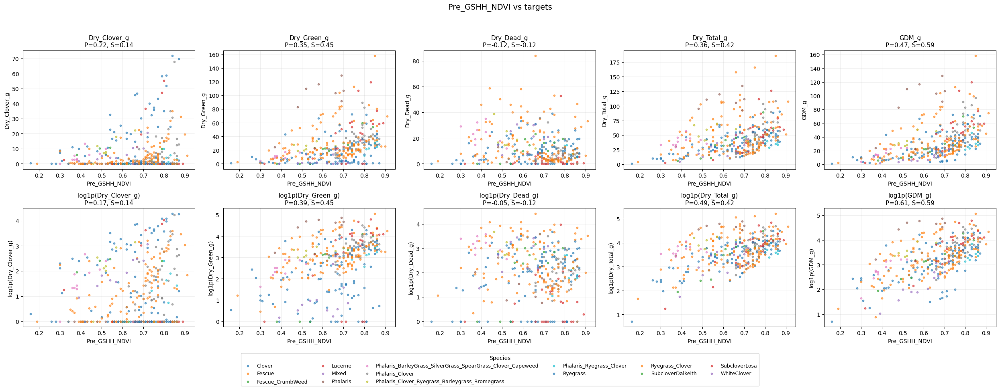

In [61]:
print(full_df)
su.print_biomass_2xN(full_df, target_col="Pre_GSHH_NDVI", hue_col="Species",
                y_cols=("Dry_Clover_g", "Dry_Green_g","Dry_Dead_g","Dry_Total_g","GDM_g"))
                # y_cols=("Dry_Total_g","GDM_g"))

### Observations and Actions

#### 1) Observations

| # | Observation |
|---:|---|
| 1 | **NDVI relates strongly to “green/total mass”**, weakly to clover, and almost not to dead biomass. Strength order (from the plots): **GDM_g strongest**, then **Dry_Total_g ≈ Dry_Green_g**, then **Dry_Clover_g weak**, **Dry_Dead_g ~ none / slight negative**. |
| 2 | **Large spread at high NDVI (~0.7–0.9)** → NDVI “tops out” (saturation): many samples look equally green but biomass still varies. |
| 3 | **Species colors spread differently at the same NDVI** → clear **species interaction**: same NDVI can mean different biomass depending on species mix. |

#### 2) Effect of `log1p`

| # | Effect |
|---:|---|
| 1 | `log1p` **cleans up** the relationship for **Dry_Green_g, Dry_Total_g, and especially GDM_g** (less dominated by large values; points look more linear/tighter). |
| 2 | `log1p` **does not fix Dry_Clover_g** much because the main issue is many zeros + occasional spikes (zero-inflation). |
| 3 | `log1p` **does not help Dry_Dead_g** because NDVI simply isn’t strongly tied to dead material. |

#### 3) Inference

| # | Inference |
|---:|---|
| 1 | Keep **NDVI raw** (don’t log it). Apply `log1p` to **GDM_g, Dry_Total_g, Dry_Green_g**; consider special handling for **Dry_Clover_g** (presence/absence + amount) and accept weaker predictability for **Dry_Dead_g**. |
| 2 | Because **species changes the NDVI→biomass mapping**, include **species conditioning** in the model (species embedding, or separate heads per species group, or explicit interaction like `NDVI × species_embedding`). |
| 3 | Expect NDVI to be a **good baseline predictor** for total/green biomass, but to reach high accuracy you’ll need **image features (texture/coverage)** to resolve the wide spread at high NDVI. |


### Let's briefly look at the outliers, are they really valid images

2
        sample_id          Species  Pre_GSHH_NDVI  Height_Ave_cm  Dry_Clover_g  Dry_Dead_g  Dry_Green_g  Dry_Total_g  GDM_g
179  ID1963715583           Clover           0.16            1.0          0.34         0.0          0.7         1.04   1.04
347   ID956512130  Ryegrass_Clover           0.19            1.0          0.00         1.9          2.4         4.30   2.40


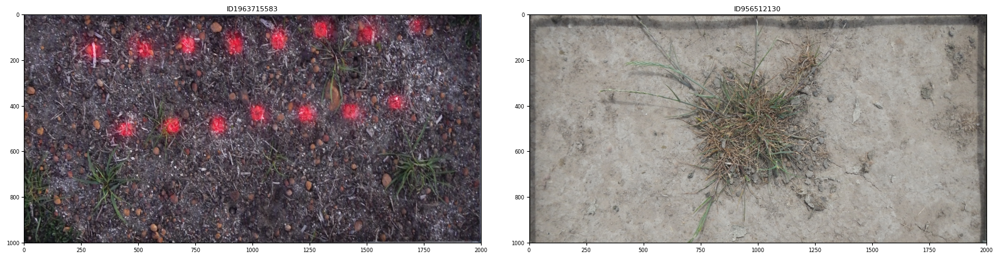

In [62]:
low_ndvi_df = full_df[full_df["Pre_GSHH_NDVI"] < 0.25]
print(len(low_ndvi_df))
print(low_ndvi_df[all_cols])


train_imgs_dir_pth = "../data/csiro-biomass/"

su.show_images_grid(
    low_ndvi_df["sample_id"],
    base_dir=train_imgs_dir_pth,
    split="train",
    cols=3,
    max_images=24
)

Before : 357
1
       sample_id          Species  Pre_GSHH_NDVI  Height_Ave_cm  Dry_Clover_g  Dry_Dead_g  Dry_Green_g  Dry_Total_g  GDM_g
346  ID956512130  Ryegrass_Clover           0.19            1.0           0.0         1.9          2.4          4.3    2.4


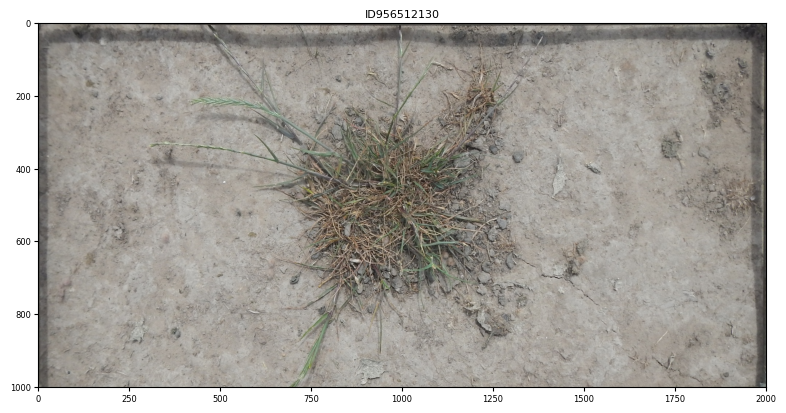

After : 356


In [63]:
print(f"Before : {len(full_df)}")

# REmove ID1963715583
bad_id = "ID1963715583"   # the one with the red dots
full_df = full_df[full_df["sample_id"] != bad_id].reset_index(drop=True)

low_ndvi_df = full_df[full_df["Pre_GSHH_NDVI"] < 0.25]
print(len(low_ndvi_df))
print(low_ndvi_df[all_cols])

train_imgs_dir_pth = "../data/csiro-biomass/"

su.show_images_grid(
    low_ndvi_df["sample_id"],   # or .tolist()
    base_dir=train_imgs_dir_pth,
    split="train",
    cols=3,
    max_images=24
)

print(f"After : {len(full_df)}")

### Raw NDVI vs log1p(NDVI) 

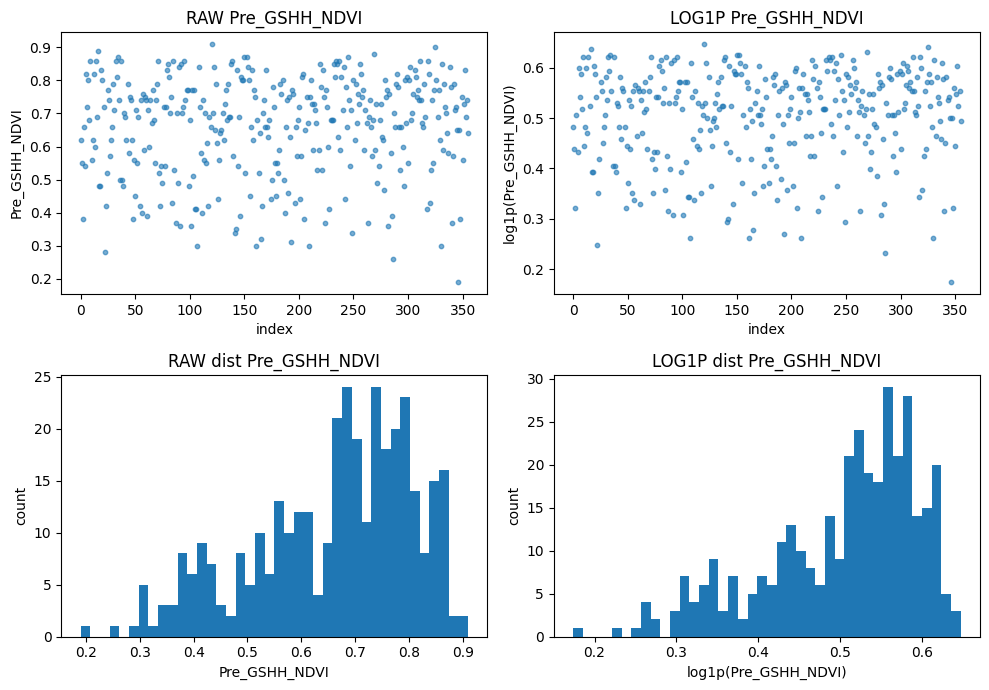

In [64]:
# Example (your columns)
cols = ["Pre_GSHH_NDVI"]

su.scatter_raw_and_log1p_one_row(full_df, cols, max_points=5000)

From this plot (RAW vs LOG1P for **Pre_GSHH_NDVI**), the takeaway is simple:

* **NDVI is already bounded and well-behaved** (roughly ~0.2 to ~0.9 here). It doesn’t have the “long right tail” problem that log transforms are meant to fix.
* Applying `log1p` **just compresses the scale** (high values get squished more than low values) but **the pattern doesn’t improve**—it’s basically the same scatter, just re-labeled.
* **Inference:** **Do NOT `log1p` NDVI.** Keep NDVI as-is (maybe only normalize/standardize if your model benefits), and reserve `log1p` for biomass targets like **Dry_Total_g / GDM_g / Dry_Green_g**.

> Use `log1p` for positive heavy-tailed targets; do **not** log-transform bounded indices like NDVI.


## How does Pre_GSHH_NDVI relate to Species ?

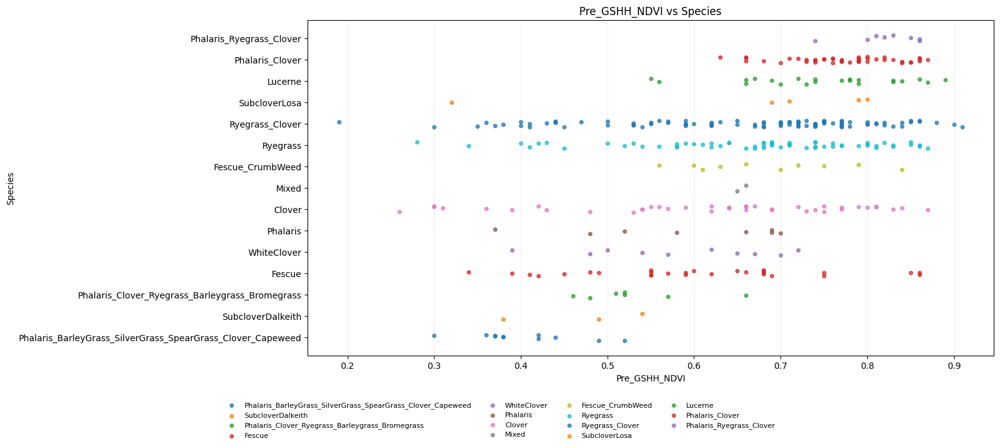

In [65]:

su.ndvi_vs_species_hscatter(full_df, ndvi_col="Pre_GSHH_NDVI", species_col="Species")


#### 1) Key observations from **NDVI vs Species**

* **NDVI is species-dependent.** Some species/groups (e.g., **Lucerne**, **Phalaris_Clover**) cluster mostly at **high NDVI (~0.65–0.9)**, while others (e.g., **Ryegrass_Clover**, **Clover**) span a **much wider NDVI range (~0.3–0.9)**.
* **Within-species variability differs a lot.** “Mixture” labels like **Ryegrass_Clover** show broad spread, suggesting they cover multiple field conditions (sparse → dense canopy).
* **Low-NDVI pockets exist but are not uniform across species.** A few labels contain most of the very low NDVI samples (~0.2–0.4), which are potential edge cases/outliers.

#### 2) Data preparation takeaways

* **Stratify by Species × NDVI** when splitting train/val/test (or during sampling) so each split has similar coverage of NDVI ranges *within each species*. Otherwise validation can look “easy” or “hard” just because NDVI distribution shifted.
* **Audit the low-NDVI tails per species.** For each species, inspect the bottom NDVI samples (e.g., lowest 5–10%) using your image grid—these are where capture issues or label noise usually hide.
* **Handle rare species / imbalanced groups.** Some species clearly have fewer points; consider oversampling/weights so the model doesn’t ignore them (especially if they matter for deployment).

#### 3) Modeling takeaways

* **Model needs species conditioning.** Since NDVI distributions differ by species, the mapping from image features → targets is also species-specific. Use a **species embedding** (or species as an input feature) so the model can learn different “NDVI-to-biomass” regimes per species.
* **Expect different difficulty by species.** Tight NDVI clusters (consistent species) are easier; wide-spread mixture labels are harder. Consider **per-species metrics** (R² / MAE) so you don’t get fooled by overall averages.
* **Interaction matters:** include an interaction mechanism like **(image features ⊕ species embedding)** or explicitly **NDVI × species_embedding** in simpler models, because the same NDVI level can correspond to different biomass depending on species mix.


3
        sample_id          Species  Pre_GSHH_NDVI  Height_Ave_cm  Dry_Clover_g  Dry_Dead_g  Dry_Green_g  Dry_Total_g  GDM_g
22   ID1119739385         Ryegrass           0.28            4.0           0.0         3.0          6.8          9.8    6.8
286   ID661372352           Clover           0.26            1.0           0.0         0.0         10.4         10.4   10.4
346   ID956512130  Ryegrass_Clover           0.19            1.0           0.0         1.9          2.4          4.3    2.4


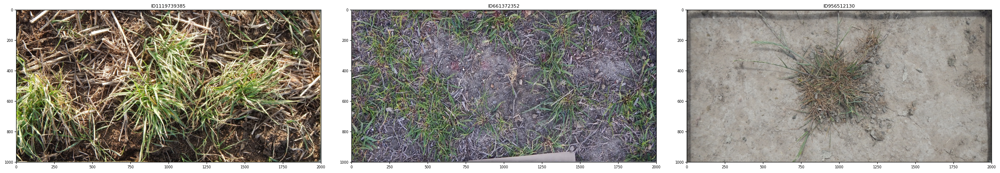

In [66]:
low_ndvi_df = full_df[full_df["Pre_GSHH_NDVI"] < 0.3]
print(len(low_ndvi_df))
print(low_ndvi_df[all_cols])


train_imgs_dir_pth = "../data/csiro-biomass/"

su.show_images_grid(
    low_ndvi_df["sample_id"],
    base_dir=train_imgs_dir_pth,
    split="train",
    cols=3,
    max_images=24
)

## NDVI (Pre_GSHH_NDVI) — consolidated observations - data prep and modeling clues.

### 1) Data preparation must-dos

* **Stratify splits by `Species × NDVI-band`** (e.g., NDVI bins like `<0.3, 0.3–0.5, 0.5–0.7, >0.7`) so train/val/test have similar coverage **within each species**. This prevents “validation surprise” from distribution shift.
* **Audit and tag the low-NDVI tail** (e.g., NDVI < 0.25 or bottom 5–10% per species) using your image grid. Either -   
(a) remove clear capture/label errors, or   
(b) keep them but mark as “edge cases” and ensure they exist in all splits.

### 2) Modeling must-dos

* **Condition the model on species** (species embedding / one-hot → fused with image features). Your plots show the NDVI/biomass mapping changes by species, so the model needs that context.
* **Use log1p targets where it helps**: apply `log1p` to **GDM_g / Dry_Total_g / Dry_Green_g**; keep **NDVI raw**. For **Dry_Clover_g**, consider a **two-stage (hurdle) setup**: predict “clover present?” + “clover amount” (only when present), because the raw scatter is zero-inflated.

### 3) Loss function changes (only if you want extra gains)

* **Use a robust regression loss for biomass heads** (e.g., Huber/SmoothL1) on the `log1p` scale to reduce the impact of rare large spikes.
* If you implement the clover hurdle:

  * add **BCE loss** for presence/absence + **regression loss** for amount (masked to non-zero cases).
* **Track per-species metrics** (not a loss, but essential): report R²/MAE per species (and per NDVI bin) so improvements aren’t hidden by dominant species like Ryegrass_Clover.


## **Height (Height_Ave_cm)**

### Height (Height_Ave_cm) Distribution Analysis

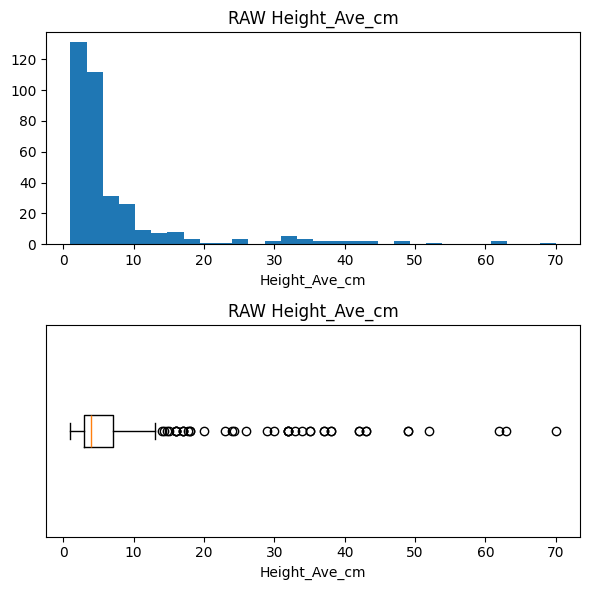

In [67]:
# cols = ["Pre_GSHH_NDVI", "Height_Ave_cm",
#         "Dry_Clover_g", "Dry_Dead_g",
#         "Dry_Green_g", "Dry_Total_g", "GDM_g"]

col_Dry_Clover_g = ["Height_Ave_cm"]
su.plot_distributions(full_df, col_Dry_Clover_g)

* **Most samples are short (heavy mass near the low end).** The histogram is strongly concentrated around roughly **~2–8 cm**, meaning most plots are low canopy height.
* **Height is strongly right-skewed (long tail to high values).** You have a small number of **very tall** samples extending all the way to **~70 cm**.
* **Central tendency is low.** The box (IQR) sits in the low single digits; median looks around **~4–5 cm** (roughly), consistent with the histogram peak.
* **Lots of outliers on the high side.** The boxplot shows many points beyond the upper whisker (above ~10–15 cm onward), so “tall” cases are rare but frequent enough to matter.
* **This is the classic shape where log1p *can* help (unlike NDVI).** Height is **positive + heavy-tailed**, so log1p can compress extreme heights and make modeling/optimization easier if your loss is sensitive to big values.

**Next steps (practical):**

* **Inspect the extreme-height tail** (e.g., top 1–5%: >40–70 cm). Confirm they’re real (species like Lucerne can be tall) vs measurement/entry errors.
* **Decide transform strategy:**

  * If you train with MSE/MAE directly on height, consider **log1p(height)** (or at least standardize robustly) to reduce domination by tall outliers.
  * If you need interpretability in cm, you can still **predict log1p** and inverse with `expm1`.
* **Stratify splits by height bins** (low/medium/high) so train/val/test all contain some tall cases—otherwise evaluation can swing wildly depending on whether the rare tall tail lands in one split.

**Height = positive heavy tail → log1p is reasonable (after sanity-checking outliers).**


### Height_Ave_cm Relationships with Biomass Targets (Species-colored)

        sample_id            Species  Pre_GSHH_NDVI  Height_Ave_cm  Dry_Clover_g  Dry_Dead_g  Dry_Green_g  Dry_Total_g    GDM_g
0    ID1011485656    Ryegrass_Clover           0.62         4.6667        0.0000     31.9984      16.2751      48.2735  16.2750
1    ID1012260530            Lucerne           0.55        16.0000        0.0000      0.0000       7.6000       7.6000   7.6000
2    ID1025234388  SubcloverDalkeith           0.38         1.0000        6.0500      0.0000       0.0000       6.0500   6.0500
3    ID1028611175           Ryegrass           0.66         5.0000        0.0000     30.9703      24.2376      55.2079  24.2376
4    ID1035947949           Ryegrass           0.54         3.5000        0.4343     23.2239      10.5261      34.1844  10.9605
..            ...                ...            ...            ...           ...         ...          ...          ...      ...
351   ID975115267             Clover           0.73         3.0000       40.0300      0.0000       0.800

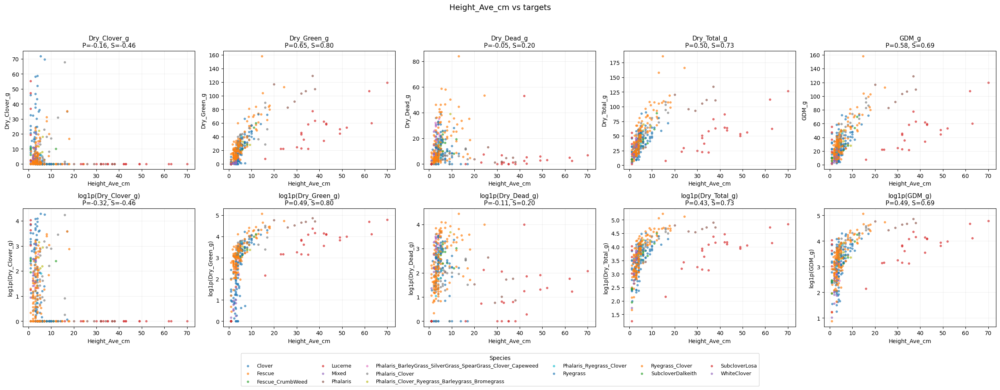

In [68]:
print(full_df)
su.print_biomass_2xN(full_df, target_col="Height_Ave_cm", hue_col="Species",
                y_cols=("Dry_Clover_g", "Dry_Green_g","Dry_Dead_g","Dry_Total_g","GDM_g"))

#### 1) What the graphs *quantitatively* show (Observations)

* **Height is a strong signal for green/total biomass.**
  From the *Height_Ave_cm vs targets* plots:

  * **Dry_Green_g:** Pearson **$r \approx 0.65$**, Spearman **$\rho \approx 0.80$**
  * **Dry_Total_g:** Pearson **$r \approx 0.50$**, Spearman **$\rho \approx 0.73$**
  * **GDM_g:** Pearson **$r \approx 0.58$**, Spearman **$\rho \approx 0.69$**
    Interpretation: as height increases, green/total/GDM increase reliably (strong monotonic trend, especially Spearman).

* **Height is weak / not useful for Dead biomass (and not clean for Clover).**

  * **Dry_Dead_g:** Pearson **$r \approx -0.05$** (≈ no linear relation), Spearman **$\rho \approx 0.20$** (very weak monotonic relation)
  * **Dry_Clover_g:** Pearson **$r \approx -0.16$**, Spearman **$\rho \approx -0.46$** (this negative $\rho$ is typically a “data-shape” effect: many zeros + mixed species patterns rather than a stable physical rule)

* **Height distribution is highly right-skewed (long tail).**
  From the histogram + boxplot:

  * Typical height mass is around **$\sim 2$ to $10$ cm** (dense region).
  * There is a long tail with many outliers **>$15–20$ cm**, reaching roughly **$\sim 70$ cm**.
    Practical meaning: rare tall samples can dominate training unless handled.

#### 2) Data preparation actions (must do)

* **Handle the long-tail in Height explicitly (because max $\sim 70$ cm, bulk $\sim 2–10$ cm).**
  Recommended: **clip** height at a high percentile (e.g., 99th / 99.5th) *or* use **robust scaling** (median/IQR) so the rare tall cases don’t dominate gradients.

* **Audit the extreme-height tail.**
  Since heights go up to **$\sim 70$ cm** while most are **$\lt 10$ cm**, visually inspect the **top 1–5% tallest** samples using your image grid to confirm they are valid (not ROI/label issues).

* **Stratify splits by Species × Height buckets.**
  Because relationships differ by species (clear color separation in the scatter), ensure train/val/test have similar **height coverage within each species** to avoid distribution shift.

#### 3) Modeling + Loss (what must change)

**Modeling (must do)**

* **Use species conditioning + interaction with height.**
  Since the height→biomass mapping is species-dependent, feed **species embedding** and let the model learn interactions like **Height × SpeciesEmbedding** (or fuse height + species embedding before biomass heads).
  This is especially important because even with strong overall correlations (e.g., **Dry_Green: $\rho \approx 0.80$**), the slope/band differs by species.

* **Expect best results on Green/Total/GDM; expect lower ceiling on Dead/Clover from height alone.**
  Supported by correlations:

  * Strong: **Dry_Green ($r\approx0.65,\ \rho\approx0.80$)**, **Dry_Total ($r\approx0.50,\ \rho\approx0.73$)**, **GDM ($r\approx0.58,\ \rho\approx0.69$)**
  * Weak: **Dry_Dead ($r\approx-0.05,\ \rho\approx0.20$)**
    Therefore, dead/clover predictions must rely more on **image texture/coverage cues** than height.

**Loss / objective (only if required, but recommended given the plot shapes)**

* **Clover likely needs a hurdle-style loss (because it looks zero-inflated).**
  Instead of a single regression:

  1. **presence/absence** (BCE) +
  2. **amount given present** (regression, often on log1p scale)

* **Use a robust regression loss for biomass heads (to reduce tail dominance).**
  Given heavy tails (both height and biomass), prefer **Huber / SmoothL1** (or capped weights) so extreme points don’t dominate training.

* **Track per-species metrics.**
  Because the mapping changes by species, compute **per-species R²/MAE** in addition to overall metrics (otherwise strong species can hide weak ones).

### Visual Sanity Check for Tall-Height Samples (Height_Ave_cm > 45 cm)

6
        sample_id  Species  Pre_GSHH_NDVI  Height_Ave_cm  Dry_Clover_g  Dry_Dead_g  Dry_Green_g  Dry_Total_g  GDM_g
66   ID1357758282  Lucerne           0.77           62.0           0.0         4.8        107.3        112.1  107.3
96    ID147528735  Lucerne           0.74           52.0           0.0         3.0         53.5         56.5   53.5
157  ID1859251563  Lucerne           0.83           70.0           0.0         6.9        119.6        126.5  119.6
264   ID554314721  Lucerne           0.69           49.0           0.0         2.7         50.9         53.6   50.9
271   ID576621307  Lucerne           0.73           63.0           0.0         2.4         60.2         62.6   60.2
288   ID663006174  Lucerne           0.66           49.0           0.0         5.8         44.6         50.4   44.6


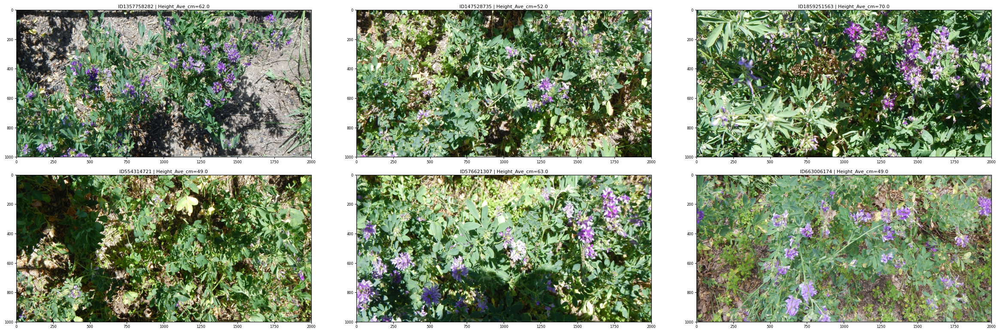

In [69]:
low_ndvi_df = full_df[full_df["Height_Ave_cm"] > 45]
print(len(low_ndvi_df))
print(low_ndvi_df[all_cols])

# csiro_su.show_images_grid(low_ndvi_df["sample_id"], df=low_ndvi_df, title_col=["Height_Ave_cm"])

su.show_images_grid(
    low_ndvi_df["sample_id"],
    base_dir=train_imgs_dir_pth,
    split="train",
    cols=3,
    max_images=24,
    df=low_ndvi_df,
    title_col="Height_Ave_cm"
)

### Raw Height_Ave_cm vs log1p(Height_Ave_cm) 

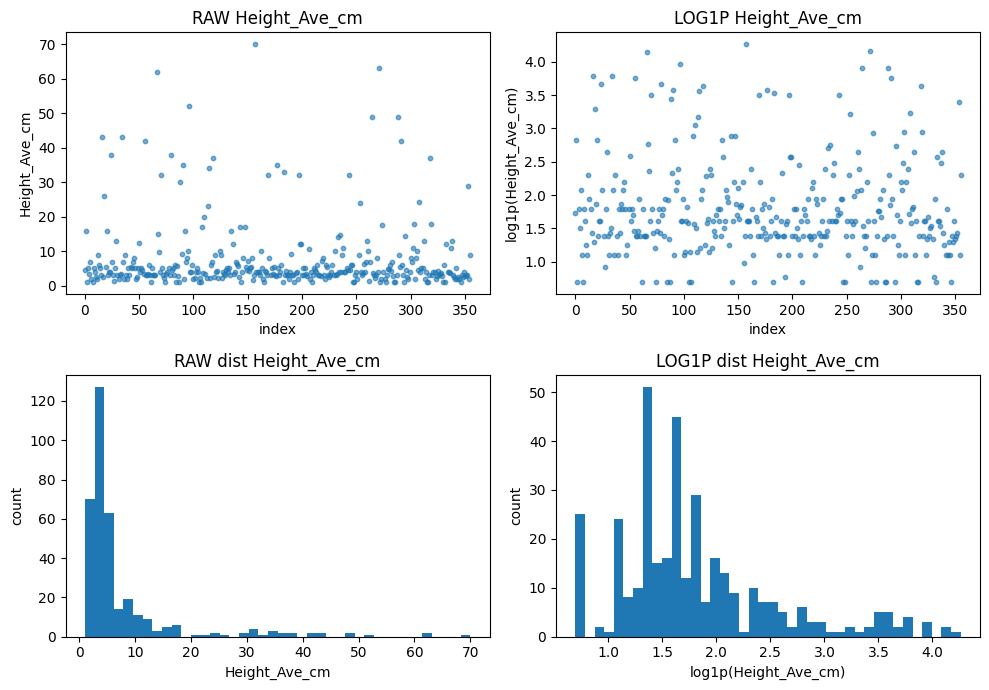

In [70]:
# Example (your columns)
cols = ["Height_Ave_cm"]

su.scatter_raw_and_log1p_one_row(full_df, cols, max_points=5000)

From this **RAW vs LOG1P Height_Ave_cm** plot, the takeaway **(treating height as an *input feature*, not a target)** is:

* **Height is strongly right-skewed (long right tail).** Most samples sit in roughly the **~0–10 cm** band, but there are **rare tall outliers up to ~70 cm**. If you feed raw height directly, those few extreme values can disproportionately influence the model (especially early training / for the MLP part).

* **`log1p(height)` does what it should here: compresses the tail.** Large heights get squashed much more than small heights, so the **~70 cm** points stop “dominating” the numeric range. This often makes the feature easier for the model to use because the bulk of the data gets more resolution.

* **Practical recommendation (for inputs): pick one of these and then standardize**

  * **Option A (simple + interpretable):** keep **Height in cm**, **clip/winsorize** extreme highs (e.g., cap at a high percentile), then **z-score normalize**.
  * **Option B (often works well):** use **`log1p(Height)`**, then **z-score normalize**.

* **Modeling hint (most important): height is species-dependent.** Even with perfect scaling, the same height can map to different biomass for different species, so feed height **together with species** (e.g., concatenate `[image_features, height_feature, species_embedding]`, and ideally include an interaction like `height_feature × species_embedding`).


## How does Height_Ave_cm relate to Species ?

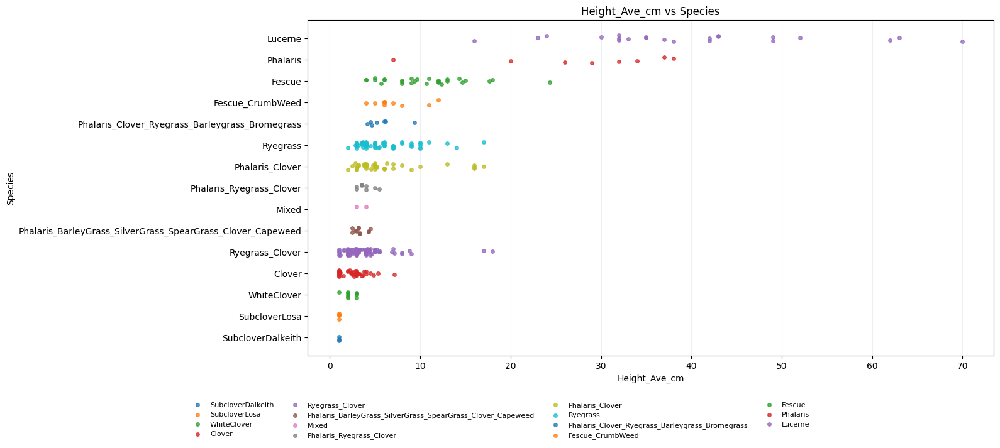

In [71]:
su.ndvi_vs_species_hscatter(full_df, ndvi_col="Height_Ave_cm", species_col="Species")

## Height (Height_Ave_cm) — consolidated observations - data prep and modeling clues.

### 1) What the graphs *quantitatively* show (Observations)

* **Height is extremely right-skewed (long tail).** Most samples are in the **~0–10 cm** band (hist peak roughly **~2–8 cm**). The **median is ~4–5 cm** (boxplot). But there are **rare tall outliers up to ~70 cm**, and many points beyond the upper whisker (roughly **>10–15 cm** onward).
* **Height is a strong signal for green/total biomass (and GDM), but not for dead/clover.** From *Height vs targets* plots:

  * **Dry_Green_g:** Pearson **~0.65**, Spearman **~0.80** (strong + monotonic)
  * **Dry_Total_g:** Pearson **~0.50**, Spearman **~0.73** (moderate/strong + monotonic)
  * **GDM_g:** Pearson **~0.58**, Spearman **~0.69** (moderate/strong + monotonic)
  * **Dry_Dead_g:** Pearson **~−0.05**, Spearman **~0.20** (basically weak / near-none)
  * **Dry_Clover_g:** Pearson **~−0.16**, Spearman **~−0.46** (negative/unstable; typically “data-shape” driven: many zeros + species effects)
* **Height is species-dependent (distribution shift by species).** In *Height vs Species*, **Lucerne** (and some **Phalaris**) spans much larger heights (reaching **~70 cm**), while many others cluster mostly **<~10–15 cm**. So the meaning of “20 cm” is **not comparable across species** unless the model knows the species.

### 2) Data preparation must-dos (what you must do)

* **Audit the extreme-height tail (top ~1–5%) per species.**
  Because heights go to **~70 cm** while the bulk is **~0–10 cm**, those tall cases can be: (a) real (e.g., Lucerne), or (b) capture/ROI/label issues. Use your image grid to sanity-check those samples.
* **Stratify splits by `Species × Height-bin` (not just random split).**
  If one split accidentally gets more tall-Lucerne cases, validation/test will swing even if the model didn’t change. Make height bins inside each species (example bins: **0–3**, **3–7**, **7–15**, **15+ cm**) and stratify within species.
* **Treat height as a “heavy-tail” numeric feature during scaling.**
  Since you’re **not predicting height** (it’s an input feature), the goal is to stop rare tall values from dominating the numeric scale:

  * Prefer **robust scaling** (median/IQR) over mean/std, **or**
  * Apply **log1p(height)** *as an input feature transform*, then standardize (this compresses the **0–70 cm** tail while preserving ordering).
    Either way, you keep interpretability because you can always log/inverse only internally—your targets stay unchanged.

### 3) Modeling + loss function hints (what to do)

**Modeling (must-do)**

* **Feed Height + Species together (interaction is mandatory).**
  Because height ranges and “height → biomass” mapping change by species, concatenate something like:
  `fused = [image_features, height_feature, species_embedding]`
  and let the head learn the interaction (or explicitly include an interaction like `height_feature ⊙ species_embedding`).
* **Expect strongest gains on Dry_Green / Dry_Total / GDM; weaker ceiling on Dead/Clover.**
  This is directly supported by correlations:

  * Strong: Dry_Green (**~0.65 / ~0.80**), Dry_Total (**~0.50 / ~0.73**), GDM (**~0.58 / ~0.69**)
  * Weak: Dry_Dead (**~−0.05 / ~0.20**)
  * Clover is messy/zero-inflated and species-dependent (negative Spearman **~−0.46** in your plot).

**Loss / objective (only change if you want extra gains, but recommended)**

* **Use robust regression loss for biomass heads** (Huber/SmoothL1) on your **log1p-transformed biomass targets** (Dry_Green/Dry_Total/GDM etc.). This reduces the effect of rare large spikes/outliers (which your plots clearly show exist in both biomass and height-related regimes).
* **If Clover is truly zero-inflated:** use a **two-stage (hurdle) loss**

  1. BCE for `clover_present`
  2. regression loss for `clover_amount` (only on present cases, often on log1p scale)
* **Track per-species metrics** (R²/MAE per species, optionally per height-bin). Otherwise dominant species can hide failures on rare species/tall regimes.

If you want, I can format the above into the exact same “NDVI section” style you used earlier (same headings + “Next steps” block), but the content here is already copy-ready.


# **Species**

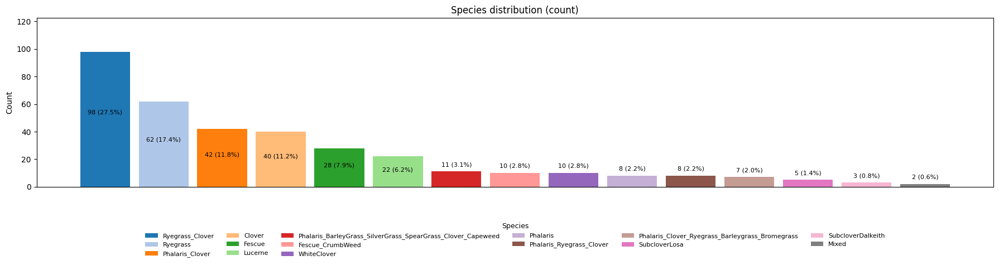

In [72]:
# usage
counts, pct = su.species_distribution_count(full_df)


### Species

#### What the plots + counts *concretely* show

Your dataset is **dominated by a few species**, and both **Height** and **NDVI** behave differently across species—so the same numeric value does **not** imply the same biomass across the dataset.

* **Imbalance is large:** top-4 species already cover **~67.9%** of data

  * Ryegrass_Clover: **98 (27.5%)**
  * Ryegrass: **62 (17.4%)**
  * Phalaris_Clover: **42 (11.8%)**
  * Clover: **40 (11.2%)**
    Meanwhile, multiple species have **≤ 5 samples** (**1.4%**, **0.8%**, **0.6%**) → they will be ignored by default training unless you intervene.

* **Height is species-dependent:** the **~70 cm** extreme heights come mostly from **Lucerne** (and some **Phalaris**) while many other species live mostly around **~0–10/15 cm**.
  Practical meaning: **20 cm** is not “equivalent canopy” across species.

* **Height→biomass is strong for green/total/GDM but weak for dead/clover (overall):**

  * Dry_Green: **Pearson ≈ 0.65**, **Spearman ≈ 0.80**
  * Dry_Total: **Pearson ≈ 0.50**, **Spearman ≈ 0.73**
  * GDM: **Pearson ≈ 0.58**, **Spearman ≈ 0.69**
  * Dry_Dead: **Pearson ≈ −0.05**, **Spearman ≈ 0.20** (near-no relationship)
  * Dry_Clover: **Pearson ≈ −0.16**, **Spearman ≈ −0.46** (not a stable physical rule; driven by zeros + species effects)

**Key implication:** those correlation numbers are “global” and will be **dominated by the big species** (Ryegrass_Clover/Ryegrass). Per-species slopes can differ, so the model must know the species.


## Species — consolidated observations - data prep and modeling clues.

### 1) Data prep (prevent misleading validation + reduce imbalance bias)

**Split in a species-aware way**: do **Species × NDVI-bin × Height-bin** stratification (within species).
Reason: because tall heights are concentrated in a few species (Lucerne/Phalaris), a random split can accidentally put more tall-Lucerne in one split and your validation will “move” even if the model didn’t improve.

**Handle imbalance explicitly** (because top-4 = **67.9%**):

* Use either a **WeightedRandomSampler** or **species-weighted loss**, where weight is roughly `1 / count(species)` (clip the maximum weight so tiny species don’t dominate).
* Otherwise training will mostly optimize **Ryegrass_Clover (27.5%)** and **Ryegrass (17.4%)**, and rare species will look bad at deployment.

**Treat height as a heavy-tailed input feature** (you’re not predicting height, but it still affects learning):

* Because height has rare values up to **~70 cm**, prefer **robust scaling** (median/IQR) or **log1p(height) then standardize** so a few tall points don’t dominate the numeric range.


### 2) Modeling (make species a conditioning variable + allow interactions)

**Species conditioning is not optional** here. Use a **species embedding** and fuse it with image + NDVI + height:

* `fused = [image_features, ndvi, height_feature, species_emb]`

Then make it easier for the network to learn *species-specific slopes* by adding interaction capacity:

* simplest: an MLP that takes `[ndvi, height, species_emb]` together
* better (often): explicitly include `height * species_emb` and `ndvi * species_emb` as extra inputs

This directly targets the reality shown in your plots: “same height/NDVI → different biomass depending on species.”


### 3) Loss / targets (match your target behavior)

Your own plots already support:

* Use **log1p** targets for **Dry_Green_g, Dry_Total_g, GDM_g** (tightens the relationship and reduces spike dominance).
* **Dry_Dead_g**: expect a lower ceiling from structured features (since correlation is ~**−0.05 / 0.20**); you’ll rely more on image texture cues.
* **Dry_Clover_g**: treat as **zero-inflated**; log1p alone won’t fix the “many zeros + occasional spikes” pattern.

So for stability:

* Use **SmoothL1/Huber** for the regression heads (on transformed scale), to reduce sensitivity to rare spikes.
* If Clover matters, the best-behaving setup is often a **hurdle**:

  * BCE for `clover_present`
  * regression for `clover_amount` only when present

Finally, **species-balanced training signal**:

* Either weight per-sample loss by `1/count(species)` (clipped), or compute loss per species and average (macro-loss). This prevents the top species (67.9% in top-4) from deciding everything.

### 4) Evaluation (so you don’t get fooled)

Always report **overall + per-species** metrics.
With your distribution, a good overall $R^2$ can mostly mean “good on Ryegrass_Clover/Ryegrass” while rare species silently fail.

If you want the most informative minimal set:

* overall $R^2$/MAE
* per-species $R^2$/MAE
* optionally per-species within height bins (because tall tail is species-driven)


## **Dry_Clover_g**

### Dry_Clover_g: Distribution and Outliers

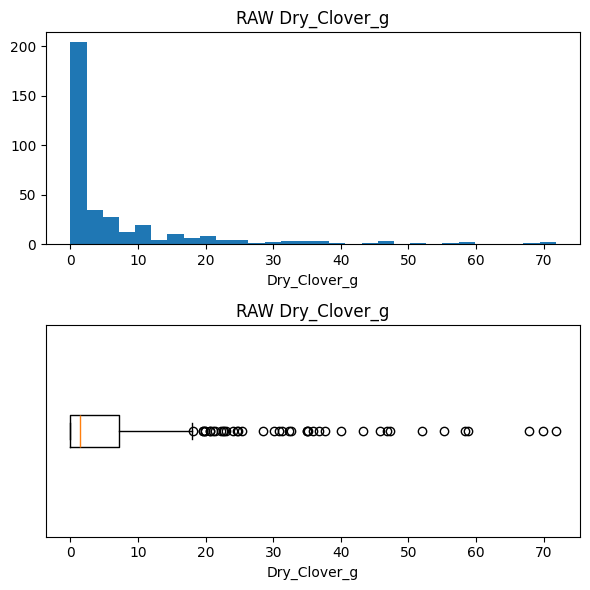

In [73]:

col_Dry_Clover_g = ["Dry_Clover_g"]
su.plot_distributions(full_df, col_Dry_Clover_g)

* **Most samples are near zero (zero-heavy / sparse presence).** The histogram is strongly concentrated at (or very close to) **0 g**, meaning in many plots clover is absent or negligible.
* **Dry_Clover_g is strongly right-skewed (long tail).** A small number of samples extend all the way out to **~70 g**, creating a heavy tail.
* **Central tendency is very low.** The box (IQR) sits close to the low end, and the median is near the bottom of the scale, consistent with “mostly zero / small values.”
* **Lots of high-side outliers.** The boxplot shows many points beyond the upper whisker, with rare but important large clover masses that can dominate MSE-type losses.
* **This is a classic “zero-inflated + heavy-tail” target where plain regression struggles.** Unlike height (which is positive heavy-tailed), clover has a **presence/absence component** plus an **amount** component when present. A single regression head often learns the “predict zero” shortcut.

**Next steps (practical):**

* **Inspect the extreme tail** (e.g., top **1–5%**, roughly **>40–70 g**) to confirm these are real biological cases vs labeling/entry errors (because they disproportionately drive gradients).
* **Decide transform strategy (recommended):**

  * Apply **`log1p(Dry_Clover_g)`** for the amount to reduce dominance of large values and stabilize variance.
  * But note: **`log1p` won’t fix the zeros**—it only compresses the tail.
* **Use a two-part (“hurdle”) approach if possible:**

  * **Head 1:** `clover_present = (Dry_Clover_g > 0)` (classification).
  * **Head 2:** regress **amount** (preferably `log1p`) **only for present samples** (mask the loss when absent).
* **Stratify splits by clover presence (and optionally clover-amount bins).** Ensure train/val/test all contain some “high clover” cases; otherwise evaluation will swing depending on where the rare tail lands.

**Dry_Clover_g = zero-inflated + heavy tail → `log1p` helps the tail, but a presence/amount (two-stage) model is usually the cleanest fit.**


### Dry_Clover_g (target) vs (inputs) Height, NDVI, and Species

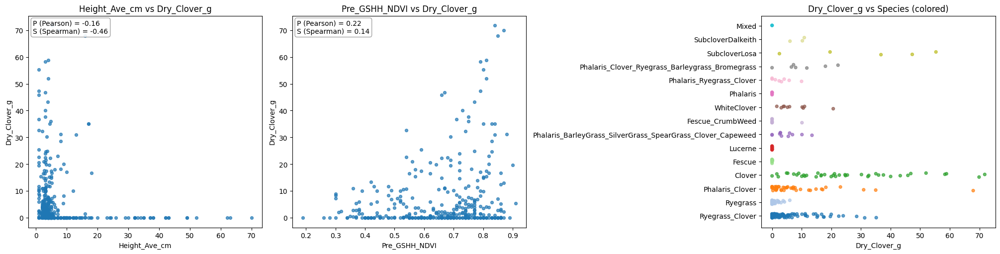

In [74]:
su.plot_target_vs_height_ndvi_species(full_df, target_col="Dry_Clover_g")

### 1. Distribution Characteristics

- **Zero-Inflation:** The dataset is dominated by cases with 0 g of clover. This occurs across multiple species, indicating that clover is often entirely absent.
- **Heavy Tail:** When clover is present, most values are small (0–10 g), but the distribution extends to a "strong right tail" with rare outliers reaching up to 70–72 g.

### 2. Key Predictor Relationships

In the case of your data, the **Spearman** value is often much stronger than the **Pearson** value. This usually means your data is **non-linear** or contains many **zeros/outliers**, which the Spearman method handles better by looking at "rank" rather than raw distance.

#### **Detailed Interpretation Table**

| Factor | Metric & Value | Interpretation (How the metric sees the data) |
| --- | --- | --- |
| **Height** | **Pearson:**  | **Weak Linear Drop:** If you try to draw a perfectly straight line, it only shows a very slight downward slope. It struggles because the relationship isn't a "constant" drop. |
|  | **Spearman:**  | **Moderate Consistent Drop:** When you ignore the raw numbers and just look at the *order* (rank), it’s clear that as Height goes up, Clover almost always goes down. It detects a much stronger trend than Pearson because it doesn't care if the drop is a straight line. |
| **NDVI** | **Pearson:**  | **Slight Linear Rise:** Suggests a weak "more green = more clover" trend. However, because your clover data has many **zeros**, this straight-line math is easily "pulled" or distorted by outliers. |
|  | **Spearman:**  | **Very Weak Order Trend:** Surprisingly lower than Pearson. This indicates that while there are some high-NDVI/high-clover outliers (which boost Pearson), the general *rank* of the data doesn't follow a reliable "upward" pattern. |


* **Pearson (Linear):** Asks, *"Do these two variables change together at a constant, fixed rate (like a straight line)?"* It is very sensitive to the **zeros** and the **heavy tail** in your `Dry_Clover_g` data.
* **Spearman (Monotonic):** Asks, *"When one variable goes up, does the other generally go up (or down), regardless of the 'shape' of the curve?"* It is much better for your data because it handles the non-normal distribution of clover biomass by using ranks.

Since **Spearman (-0.46)** for Height is significantly stronger than your **Pearson (-0.16)**, your predictive model (using PyTorch) should not assume a simple linear weight. You will likely need a non-linear activation (like **ReLU**) or a specific way to handle the **Zero-Inflation** to capture the relationship the Spearman metric is pointing out.

### 3. Modeling Implications

- **Zero-Inflation Handling:** Because of the "two-regime" nature, a standard regression may struggle. A **Hurdle Model** or **Zero-Informed approach** (predicting presence vs. absence first, then amount) would likely perform better.
- **Species Sensitivity:** Since the dataset is imbalanced by species, "global" trends are easily dominated by the most frequent species. Predictions must be heavily conditioned on the species label.


### Dry_Clover_g: Raw vs log1p (Scatter + Distribution)

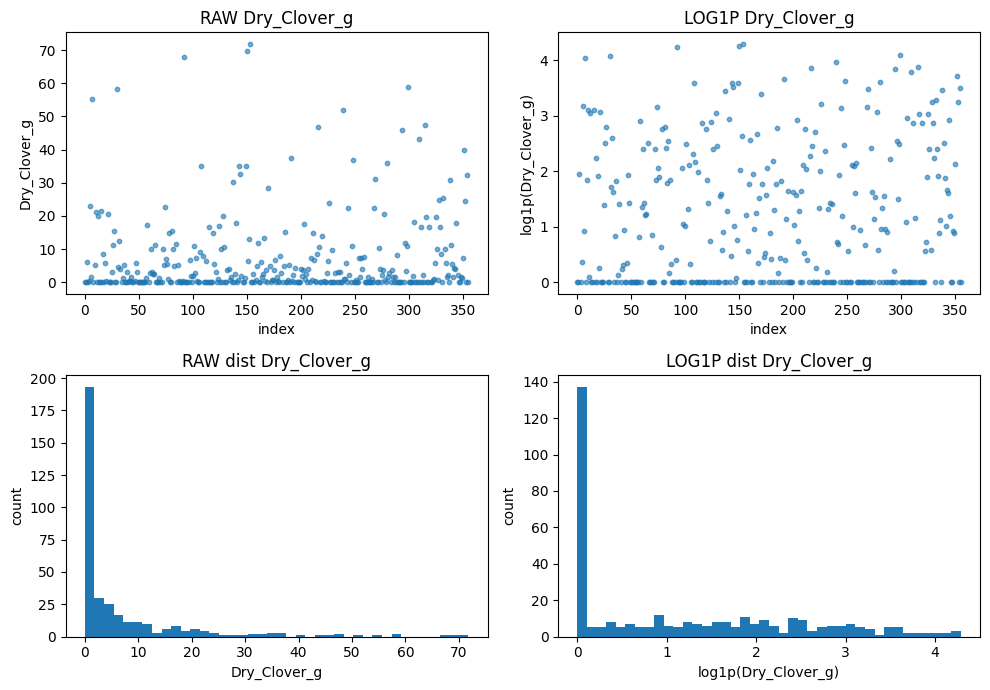

In [75]:
    # Example (your columns)
cols = ["Dry_Clover_g"]

su.scatter_raw_and_log1p_one_row(full_df, cols, max_points=5000)

#### 1. Handling Right Skew (The "Long Tail")

Looking at the **RAW dist** histogram, the data is heavily concentrated near zero, with a few values stretching all the way out to 70. This "tail" can make it difficult for machine learning models (like Linear Regression) to predict accurately because they might over-prioritize the few large values (outliers).

#### 2. Compression of Scale

In the **LOG1P Dry_Clover_g** scatter plot, notice how the y-axis now only goes from 0 to about 4.5.

- The raw value of 10 becomes ≈ 2.4.
- The raw value of 70 becomes ≈ 4.2. This "squishing" of the range makes the variance more stable and the patterns easier for an algorithm to find.

#### 3. Zero-Inflation

Both sets of plots show a heavy concentration of points at exactly zero. This suggests your data has a **"Hurdle" or "Two-part" nature**:

- **Part 1:** Is there clover present? (Yes/No)
- **Part 2:** If yes, how much does it weigh?

Using the `log1p` version of this data is generally better because:

- **Reduces Outlier Influence:** High values no longer dominate the loss function (like Mean Squared Error).
- **Normalizes Variance:** It helps satisfy the assumption of homoscedasticity (constant variance) in many statistical models.
- **Better Interpretability:** A change in log-scale often represents a *percentage change* in the original scale, which is sometimes more meaningful in nature.

### **Target Dry_Dead_g — consolidated observations - data prep and modeling clues.**

#### 1. Data Preparation & Transformation

- **Stratified Splitting:** To avoid data leakage and distribution shift, use stratified splitting based on `Species` and `clover_present`. For better results, include `Height-bin` and `NDVI-bin` to ensure consistent environmental balance within each species.

- **Explicit Labeling:** Create a binary label `clover_present = 1` if `Dry_Clover_g > 0`, else `0`. This allows you to track species-specific prevalence.

- **Target Scaling:** Apply the log-transform $y' = \log(1 + x)$ to the amount target. This compresses the heavy right-skewed tail seen in the raw data (which ranges up to **70g**) into a more manageable scale.

- **Data Quality Audit:** Manually inspect the top **1–5%** of samples (near **40–70g**) to confirm they are real biological values rather than labeling errors, as these extremes can dominate training.

#### 2. Model Architecture & Conditioning

- **Two-Head (Hurdle) Model:** Use a dual-output architecture to match the "two-mass" behavior of the data:

  1. **Presence Head:** A classifier predicting the probability $p(\text{clover} > 0)$.
  2. **Amount Head:** A regressor predicting the log-transformed amount, active **only when** clover is present.

- **Species Context:** Since species show clear shifts in growth patterns, feeding `Species` as an embedding is mandatory to help the model interpret `Height` and `NDVI` correctly.

- **Interaction Capacity:** Explicitly add interaction terms like `Height * species_embedding` to allow the model to learn different growth thresholds for different species.

#### 3. Loss Functions & Constraints

- **Loss Balancing:** Combine the two heads using a weighted sum:

  $$L = \lambda_{cls} \cdot L_{presence} + \lambda_{reg} \cdot L_{amount\_masked}$$

  Start with $\lambda = 1.0$ for both and tune so neither dominates.

- **Presence Loss:** Use **BCEWithLogitsLoss**; if clover is rare, use **Focal Loss** or `pos_weight` to prevent the model from taking the "always zero" shortcut.

- **Amount Loss:** Use **SmoothL1** or **Huber loss** for the regression head, as these are robust to the outliers found in the long tail of the distribution.

- **Imbalance Protection:** Use **species-weighted losses** (weighting by $1/\text{count}$) or **macro-averaging** to ensure the model learns accurately for all species, not just the dominant ones.

- **Output Constraints:** Ensure non-negative results by using the inverse transform

  $$f^{-1}(y') = \exp(y') - 1$$

## **Dry_Dead_g**

### Dry_Dead_g : Distribution and Outliers

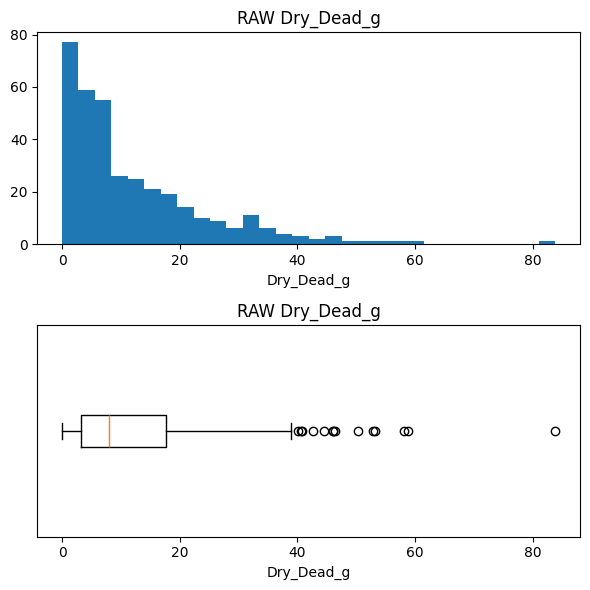

In [76]:
col_Dry_Clover_g = ["Dry_Dead_g"]
su.plot_distributions(full_df, col_Dry_Clover_g)

* **Most samples are low (mass concentrated near the bottom).** The histogram is heavily weighted toward small **Dry_Dead_g** values, with counts dropping steadily as mass increases.
* **Strong right-skew (long tail to high values).** You have a long tail stretching out to **~80+ g**, meaning a small set of plots contain very high dead biomass.
* **Central tendency is moderate/low.** The box (IQR) sits in the lower range, and the median is well below the extreme tail—consistent with “typically low-to-mid dead mass, sometimes very high.”
* **Clear high-side outliers.** The boxplot shows multiple points beyond the upper whisker (many around **~40–60 g** and at least one extreme near **~80+ g**). These can dominate squared-error losses.
* **Unlike clover, this looks more “continuous” (less zero-inflated).** There isn’t a huge spike at exactly zero; instead it’s a smoother decay from low values, which is more regression-friendly.

**Next steps (practical):**

* **Inspect the extreme tail** (e.g., top **1–5%**, roughly **>40–80 g**) to verify they are real field cases vs measurement/entry issues (dead biomass spikes can be real after grazing/drought, but still sanity-check).
* **Decide transform strategy:**

  * Consider **`log1p(Dry_Dead_g)`** to compress the long tail and reduce dominance of the largest dead-mass plots.
  * If you want to stay in grams, keep raw targets but use a **robust loss** (Huber / SmoothL1 / MAE) so outliers don’t overwhelm training.
* **Clipping / winsorizing (optional):** If a tiny number of extreme values destabilize training, consider clipping labels at a high percentile (after verifying they’re not valid important cases).
* **Stratify splits by dead-mass bins (low/medium/high).** Ensure the rare high-dead cases appear across train/val/test; otherwise validation can swing a lot depending on where the tail lands.

**Dry_Dead_g = continuous + heavy tail → either `log1p` or robust loss (or both) is usually the right move, plus bin-stratified splits for stability.**


### Dry_Dead_g (target) vs (inputs) Height, NDVI, and Species

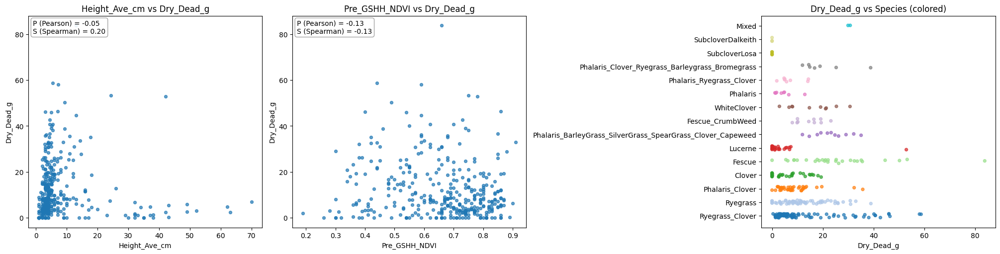

In [77]:
su.plot_target_vs_height_ndvi_species(full_df, target_col="Dry_Dead_g")

#### Distribution shape

* **Strong right-skew / long tail**: most samples are in the **~0–20 g** zone, but there are **rare large outliers** reaching **~80–85 g** (you have a point near ~82 g).
* Boxplot shows the “typical” spread is much smaller than the max:

  * median is in the **single-digit grams** range (roughly ~5–10 g by eye),
  * upper whisker goes to roughly **~40 g**,
  * then **sparse outliers** around **~45–60 g** and one around **~82 g**.

#### Relationship with Height (weak / inconsistent)

* From your plot annotation: **$P=-0.05$**, **$S=0.20$**.

  * This means **almost no linear relationship** (Pearson ~0),
  * and only a **very weak monotonic tendency** (Spearman 0.20).
* Visually: **high Dry_Dead_g happens mostly at low heights**, but *low height does not imply high dead* (lots of low-height points also have near-zero dead). So height alone can’t pin it down.

#### Relationship with NDVI (weak negative)

* From your plot annotation: **$P=-0.13$**, **$S=-0.13$** (both weak).
* Visually: at **higher NDVI (~0.7–0.9)** you mostly see **low dead**, but there are still many low-dead points everywhere → NDVI is only a mild “healthiness” hint, not a strong predictor.

#### Species effects exist, but are easy to misread due to imbalance

* The species-colored plot shows **species-specific bands/spreads** (some species show broader dead ranges, and the rare extreme outliers appear in only a few labels).
* But remember your dataset is **imbalanced** (top species dominate: *Ryegrass_Clover 98 (27.5%), Ryegrass 62 (17.4%)*, etc.), so any “overall” behavior will be heavily driven by those.

**Net takeaway for Dry_Dead_g:**
This target looks like **a weakly-driven, high-variance target** from Height/NDVI alone, with **rare but important high outliers** and **species-specific regimes**.

### Dry_Dead_g: Raw vs log1p (Scatter + Distribution)

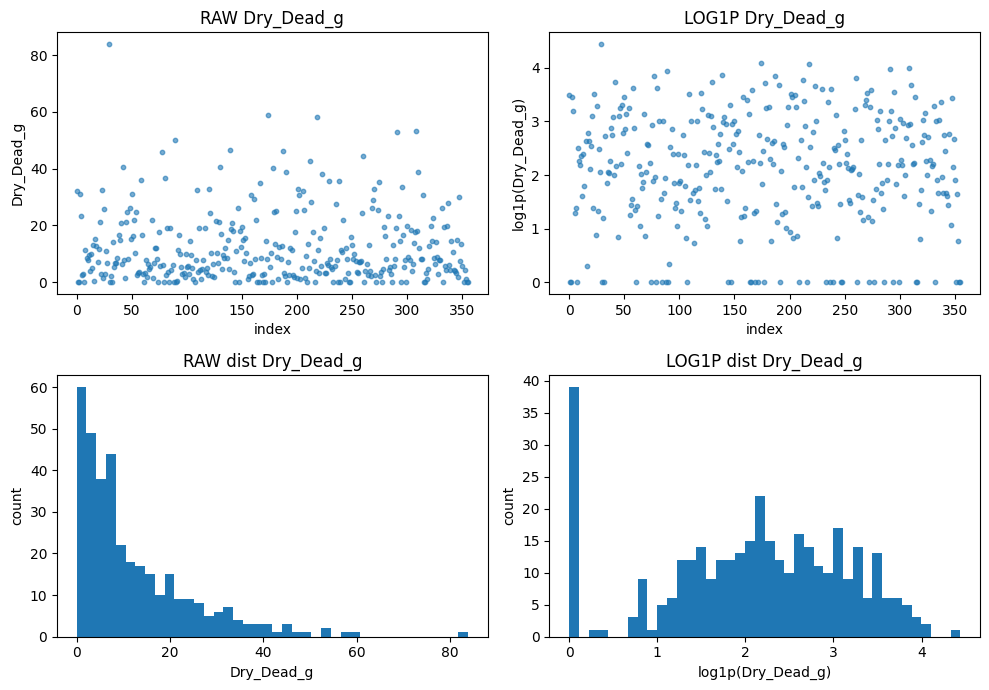

In [78]:
# Example (your columns)
cols = ["Dry_Dead_g"]

su.scatter_raw_and_log1p_one_row(full_df, cols, max_points=5000)

### Detailed and complete summary of the observations and modeling strategies for the **Dry_Dead_g** target

### 1. Data Preparation Recommendations

- **Heavy-Tail Transformation:** Train on the transformed target $y' = \log(1 + y)$ to compress the 0–85g span. This prevents the model from "chasing" outliers, though evaluation should occur on the inverse-transformed scale $y = \exp(y') - 1$.

- **Extreme Tail Audit:** Visually inspect the top **1–2%** of samples (typically **> 60g**) to verify if they are biologically accurate or the result of labeling/ROI errors. This is critical because a few extreme points can disproportionately dominate the loss function.

- **Stratified Splitting:** To prevent the sparse tail from leaking into a single split, stratify by **Species**. Ideally, also stratify by a coarse **Dead-bin** (e.g., 0–5, 5–20, 20–40, > 40) within each species to ensure consistent difficulty across train/val/test sets.

### 2. Modeling Hints

- **Feature Prioritization:** Correlations with Height ($P = -0.05, S = 0.20$) and NDVI ($P = S = -0.13$) are weak. Treat these as **context features** rather than primary drivers; the model will likely rely more on **image cues** like senescence, litter, and soil exposure patterns.

- **Species-Conditioned Head:** Feed a **species embedding** into the regression head (e.g., `fused = [image_features, height, ndvi, species_emb]`). Enhancing this with interaction terms like `height * species_emb` can provide a small performance gain.

- **Hurdle Model Consideration:** If exact zeros are dominant, use a two-stage approach: a **presence classifier** followed by an **amount regressor**. If the data is mostly low-but-nonzero (as indicated by your histogram), simple regression on the `log1p` scale is usually sufficient.

### 3. Loss Function & Expectations

- **Robust Loss Selection:** The best default for this data shape is training on $\log(1 + y)$ using **Huber** or **SmoothL1** loss. These functions prevent the rare 40–85g values from steering the model too aggressively.

- **Upper Tail Optimization:** If high dead biomass accuracy is a priority, apply a modest **tail-aware weighting** to samples above 40g or add a **quantile loss** (pinball loss) for high quantiles (0.7–0.9) as an auxiliary objective.

- **Performance Realism:** Due to weak NDVI/Height correlations, expect a lower performance ceiling for `Dry_Dead_g` compared to `Dry_Total_g`, with a higher dependence on image quality and seasonal cues.

## **Dry_Green_g**

### Dry_Green_g : Distribution and Outliers

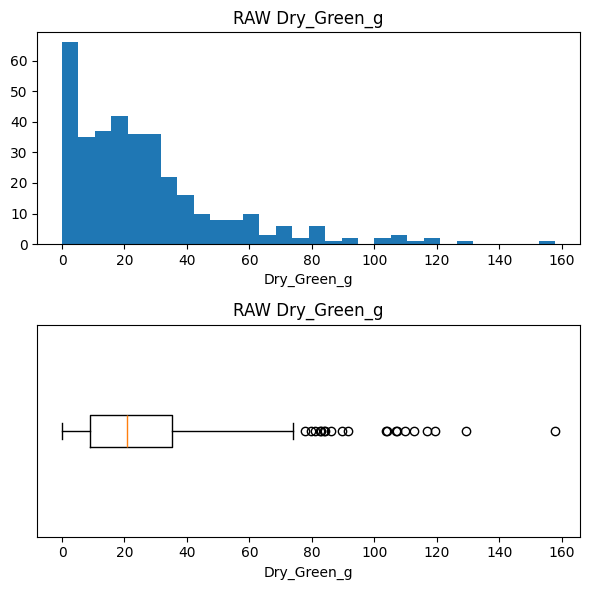

In [79]:
col_Dry_Clover_g = ["Dry_Green_g"]
su.plot_distributions(full_df, col_Dry_Clover_g)

Observations from the **RAW Dry_Green_g** histogram + boxplot:

* **Strong right-skew**: Most samples are clustered at low values, with a long tail toward higher Dry_Green_g.
* **Majority near the low range**: Bulk of the data looks concentrated roughly in the **0–40 g** region (peak in the low bins).
* **Many high-value outliers**: Boxplot shows lots of points beyond the upper whisker, especially around **80–120 g**, and a few extreme ones.
* **Extreme max around ~160 g**: There’s at least one very large outlier close to the far right end.
* **Median is relatively low** (orange line in the box), meaning typical Dry_Green_g is much smaller than the occasional high-mass cases.
* **Modeling clue**: This kind of skew + outliers usually benefits from **log1p transform** and/or **robust losses** (e.g., Huber) to reduce outlier dominance.


### Dry_Green_g (target) vs (inputs) Height, NDVI, and Species

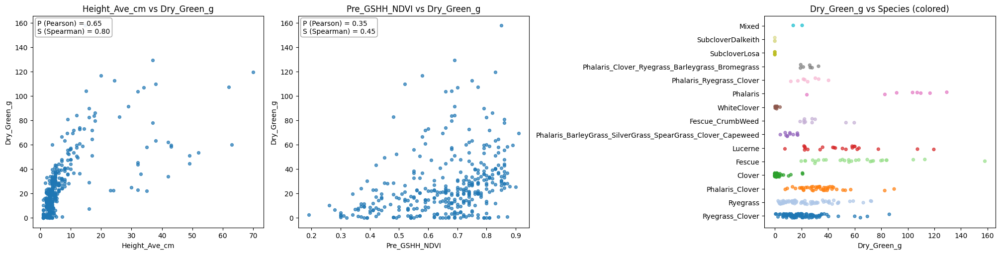

In [80]:
su.plot_target_vs_height_ndvi_species(full_df, target_col="Dry_Green_g")

* **Height is a strong driver**: Clear upward trend with height. Correlations are high (**Pearson ≈ 0.65**, **Spearman ≈ 0.80**), meaning Dry_Green_g increases with height and the relationship is strongly monotonic.

* **Nonlinear / saturating pattern**: Most points cluster at low height with low Dry_Green_g, then Dry_Green_g grows quickly as height rises. Looks more like a curved relationship than a straight line → consider log/interaction/nonlinear model capacity.

* **NDVI is a weaker predictor than height**: Positive but moderate correlation (**Pearson ≈ 0.35**, **Spearman ≈ 0.45**). NDVI helps, but it won’t explain Dry_Green_g alone.

* **Heteroscedasticity (variance increases)**: At higher NDVI/height, the spread of Dry_Green_g becomes much larger → model may benefit from log1p target or robust loss.

* **Species effect is strong (different baselines/ranges)**: The “Dry_Green_g vs Species” panel shows distinct per-species bands and different max ranges. Same Dry_Green_g value can correspond to different species distributions.

* **Outliers / high-mass cases exist**: A few samples reach very high Dry_Green_g (~150–160 g). These can dominate MSE if you train on raw scale.

* **Modeling clue**: Use **Height + NDVI + Species interactions** (e.g., species embedding with MLP, or one-hot + interaction terms) because the height→biomass mapping likely differs by species.


### Dry_Green_g: Raw vs log1p (Scatter + Distribution)

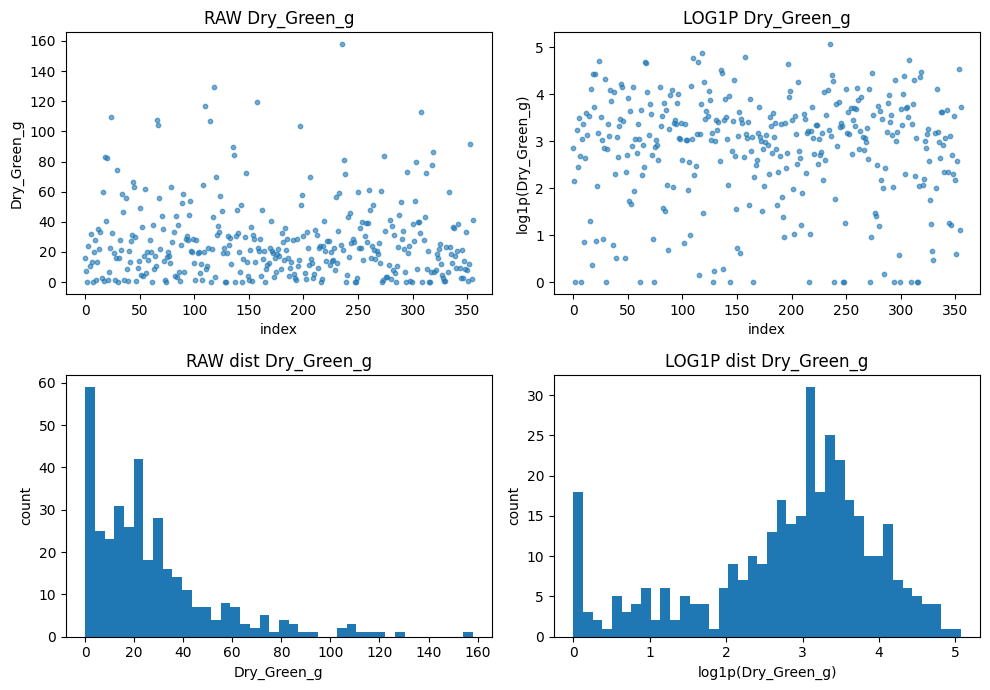

In [84]:
# Example (your columns)
cols = ["Dry_Green_g"]

su.scatter_raw_and_log1p_one_row(full_df, cols, max_points=5000)

* **Raw values are heavily right-skewed**: most samples sit in the low range, with a **long tail** going up to ~160 g → classic “few huge values” pattern.
* The **raw scatter** shows **many low values across the entire index** with occasional spikes → outliers are scattered, not confined to a specific segment.
* **log1p compresses the tail**: large raw values get pulled closer, so the spread becomes much more manageable.
* The **log1p histogram looks closer to bell-shaped** (more centered, less extreme tail) → better behaved for regression loss and gradients.
* There’s still a **pile-up near 0 / very small values** (seen in both raw and log1p) → model will need to handle “near-zero biomass” cases well (could dominate the loss if not balanced).


### Target Dry_Green_g — consolidated observations - data prep and modeling clues.

#### 1. Data Analysis & Relationships

- **Distribution Profile:** The data exhibits a **strong right-skew with a long tail**, where most samples are in the **0–40g** range, but rare extremes reach **≈ 160g**. Plain MSE will likely be dominated by these few large points.

- **Primary Driver (Height):** There is a **strong, monotonic relationship** with Height ($P \approx 0.65, \; S \approx 0.80$). High Spearman correlation indicates that while the relationship may not be perfectly linear, **Dry_Green consistently rises with height**.

- **Secondary Driver (NDVI):** NDVI shows a **moderate relationship** ($P \approx 0.35, \; S \approx 0.45$), making it a significantly weaker predictor than height for this specific target.

- **Species Imbalance:** The top 4 species represent **≈ 67.9%** of the dataset. This imbalance causes global trends and loss to be dominated by these species unless corrected.

#### 2. Data Preparation Strategy

- **Target Transformation:** Train on $y' = \log(1 + y)$ to compress the extreme **160g** tail and allow the model to learn the full range of values.

- **Advanced Stratification:** Avoid "easy/hard split" artifacts by stratifying by **Species × Height-bin × NDVI-bin**. Use specific bins such as Height (0–3, 3–7, 7–15, > 15 cm) and NDVI (< 0.3, 0.3–0.5, 0.5–0.7, > 0.7).

- **Imbalance Handling:** Implement one of the following: **WeightedRandomSampler** (weight ∝ 1/count(species)), **species-weighted loss**, or **macro-averaging** the loss across species.

- **Tail Auditing:** Manually inspect the **top 1–5%** of cases (**> 100g**) within each species to ensure they are biologically valid and not labeling or ROI errors.

#### 3. Modeling & Loss Hints

- **Mandatory Conditioning:** Species must be fed as an **embedding** fused with image and numeric features (e.g., `fused = [image_features, height, ndvi, species_emb]`).

- **Interaction Capacity:** Because the same height can imply different biomass across species, explicitly include interaction terms such as `height * species_emb` and `ndvi * species_emb`.

- **Robust Loss Selection:** Use **Huber** or **SmoothL1** loss on the $\log(1 + y)$ scale to prevent outliers from dominating the training signal.

- **Evaluation & Multi-Tasking:** Report **per-species $R^2$/MAE** to ensure accuracy isn't localized to dominant species. While Dry_Green has a lower weight (0.1) in the competition metric compared to Dry_Total (0.5), a stable head improves overall shared feature learning.


## **Dry_Total_g**

### Dry_Green_g : Distribution and Outliers

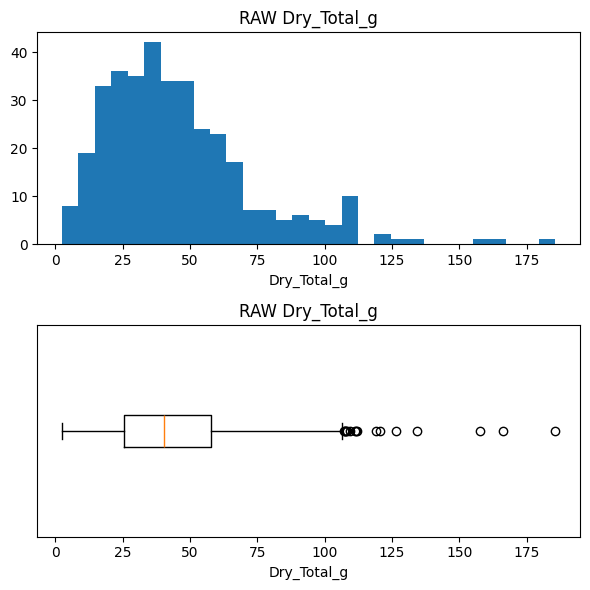

In [85]:
#  "Dry_Total_g", "GDM_g"

col_Dry_Clover_g = ["Dry_Total_g"]
su.plot_distributions(full_df, col_Dry_Clover_g)

* **Right-skewed distribution**: Most samples are in the lower–mid range, with a long tail toward large Dry_Total_g values.
* **Bulk of data around ~20–60 g**: Highest density appears in this band; values below ~10 g exist but are less common than the main cluster.
* **Median is well below the max**: Boxplot shows the median around the mid-30s/40s, while the upper tail extends far beyond → strong imbalance between “typical” and “rare high” cases.
* **Many outliers on the high end**: Several points beyond the upper whisker (roughly >100 g), including a few extreme values around ~150–185 g.
* **High variance in the tail**: A small fraction of samples contributes disproportionately to the range; raw-scale MSE will be dominated by these large targets.
* **Modeling clue**: Consider **log1p(Dry_Total_g)** (or robust loss like Huber) to reduce tail dominance and stabilize training.


### Dry_Total_g (target) vs (inputs) Height, NDVI, and Species

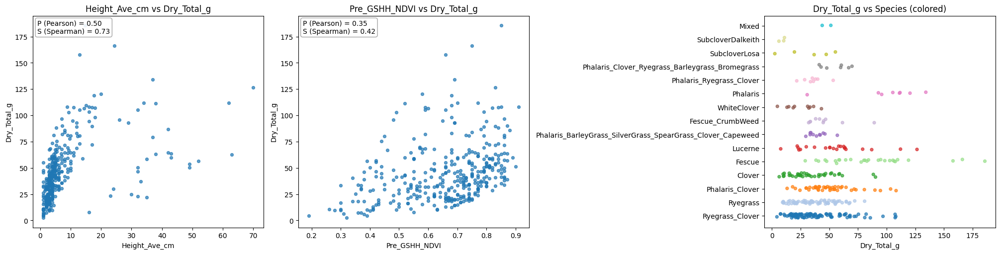

In [86]:
su.plot_target_vs_height_ndvi_species(full_df, target_col="Dry_Total_g")

### Takeaways from **Dry_Total_g vs Height, NDVI, and Species**:

#### 1) Height_Ave_cm vs Dry_Total_g

* **Clear positive relationship**: as height increases, Dry_Total_g generally increases.
* **Spearman > Pearson (S=0.73 vs P=0.50)** → the trend is **strongly monotonic but non-linear** (not a perfect straight-line fit).
* **Big spread at the same height** (especially around ~5–15 cm) → height alone can’t explain biomass; other factors (species, density, capture conditions) matter.
* **Outliers at high height**: a few very tall samples still have moderate biomass → possible noisy labels / different pasture structure / occlusion.

#### 2) Pre_GSHH_NDVI vs Dry_Total_g

* **Moderate positive association** (P=0.35, S=0.42) → NDVI helps, but is weaker than height.
* **Fan-shaped variance**: at higher NDVI (~0.7–0.9), Dry_Total_g ranges from low to very high → NDVI is not sufficient; it behaves like a “supporting” signal.
* **NDVI saturation effect**: many points clustered in high NDVI with very different biomasses → classic case where NDVI saturates in dense vegetation.

#### 3) Dry_Total_g vs Species (colored)

* **Species clearly shifts the biomass range**: some species/groups consistently sit higher/lower.
* **Within-species spread is still large**, so species is important but not the only driver.
* **Different “biomass scales” per species** → strong hint that you need **Height × Species** (and maybe NDVI × Species) interaction in the model.

#### Modeling clues

* Use **species-aware modeling** (embedding or one-hot + interaction terms).
* Consider **log1p(Dry_Total_g)** to reduce tail impact and stabilize training (since high-biomass points are sparse but influential).
* Height seems the **primary driver**, NDVI is **secondary**, species is a **key context variable**.


### Dry_Total_g: Raw vs log1p (Scatter + Distribution)

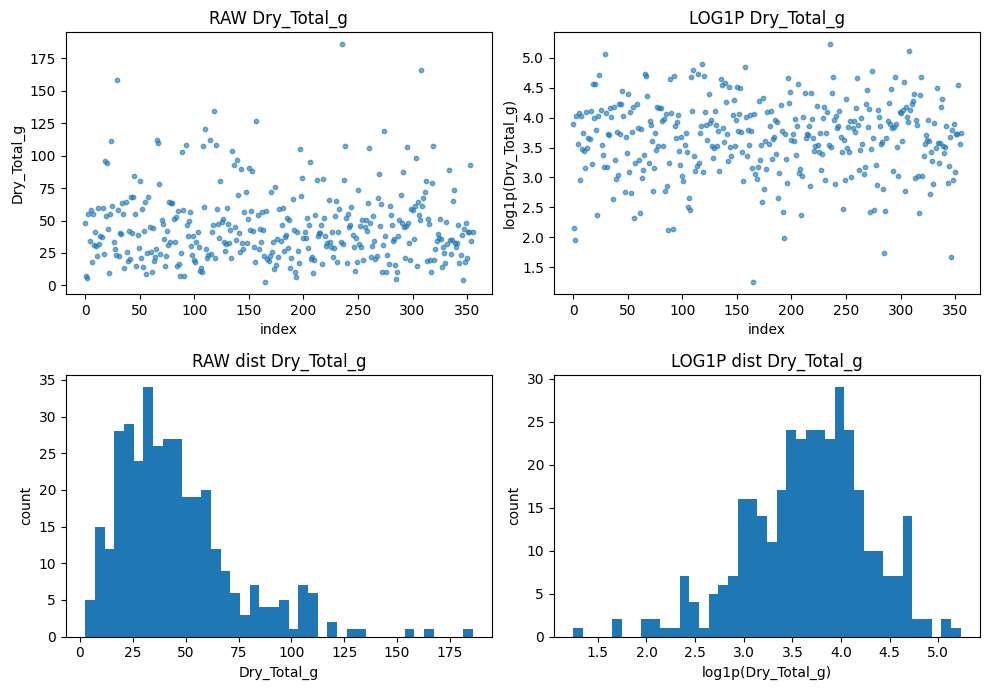

In [90]:
# Example (your columns)
cols = ["Dry_Total_g"]

su.scatter_raw_and_log1p_one_row(full_df, cols, max_points=5000)

### Target Dry_Total_g — consolidated observations - data prep and modeling clues.

#### Scoring Context

- **Critical Importance:** `Dry_Total_g` has a weight of **0.5**, making it the most significant variable for leaderboard movement compared to `GDM_g` (**0.2**) or others (**0.1**).


#### 1. Data Preparation Recommendations

- **Target Transformation:** Train using `log1p(Dry_Total_g)` to compress the **0–190g** range. This shifts the model focus from absolute to relative errors.

- **Selective Outlier Audit:** Inspect the top **1–2%** tail within each species. Rather than deleting, only **winsorize** (clip) samples that are confirmed harvest or entry errors.

- **Stratified Splitting:** Use **Species × Height-bin × NDVI-bin** for splits. Because height ranges are species-dependent, random splitting can lead to unstable validation sets.

- **Species Imbalance:** Prevent the model from overfitting "major species rules" by using a **WeightedRandomSampler** (inverse-frequency) or species-balanced sample weights in the loss function.


#### 2. Modeling Hints

- **Mandatory Species Conditioning:** Integrate a **species embedding** with image features, NDVI, and height (e.g., `fused = [img_feat, height, ndvi, species_emb]`).

- **Feature Interactions:** Explicitly include interaction terms like `height * species_emb` and `ndvi * species_emb`. This allows the model to understand that the same height represents different biomass levels across different species.

- **MLP Regression Head:** Because the **Spearman correlation (0.73)** is much higher than the **Pearson (0.50)**, the relationship is monotonic but non-linear. Use a small Multi-Layer Perceptron (MLP) for the fusion head rather than a single linear layer.

- **Capacity Priority:** Given its **0.5** weight, give this head more capacity and higher loss priority compared to other targets.


#### 3. Loss Function & Evaluation Alignment

- **Primary Loss:** Use **SmoothL1 (Huber)** on the `log1p(Dry_Total_g)` transformed target. This reduces the influence of extreme tail values (180–190g region) and prevents high-gram samples from dominating gradients.

- **Multitask Weighting:** Align your training loss with the leaderboard scoring by weighting the total loss:

  $$L_{total} = 0.5 \cdot L_{dry\_total} + 0.2 \cdot L_{gdm} + 0.1 \cdot (others...)$$

- **Relative Error Adjustment:** Optionally add a light **relative-error-style** component on the raw scale (e.g., penalizing $(pred - true)/(true + eps)$) to improve accuracy on high-biomass samples.

## **GDM_g**

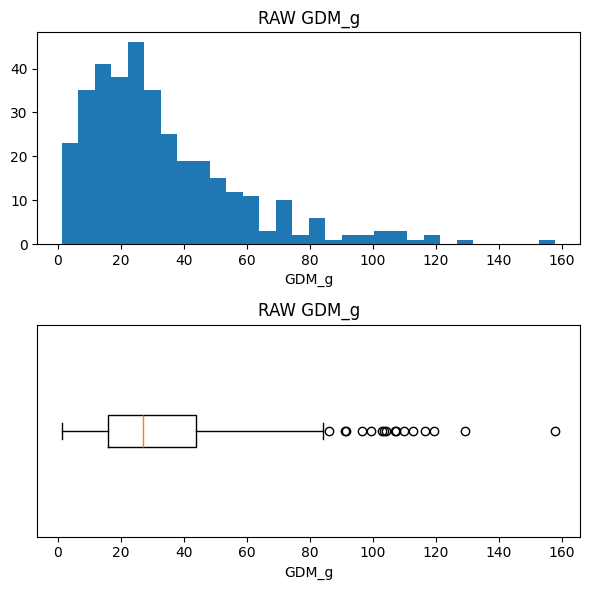

In [91]:
# "Dry_Green_g", "Dry_Total_g", "GDM_g"

col_Dry_Clover_g = ["GDM_g"]
su.plot_distributions(full_df, col_Dry_Clover_g)

* **Right-skewed distribution**: most samples are clustered roughly in the **10–50 g** range, with a **long tail** extending to ~160 g.
* **Median is relatively low** (boxplot center line), while the **upper whisker stretches far** → variability is driven by a smaller set of high-mass samples.
* **Many high-end outliers** beyond ~80–90 g (boxplot points) → these will strongly influence MSE-type losses if you train on raw scale.
* The histogram suggests a **single main mass** (no strong bimodality), but the tail is heavy → **log1p / robust loss** will usually behave better.
* Practical modeling clue: expect the model to be very good at “typical” GDM and **harder on rare high-GDM cases** unless you upweight tail samples or use a tail-aware metric.


### GDM_g (target) vs (inputs) Height, NDVI, and Species

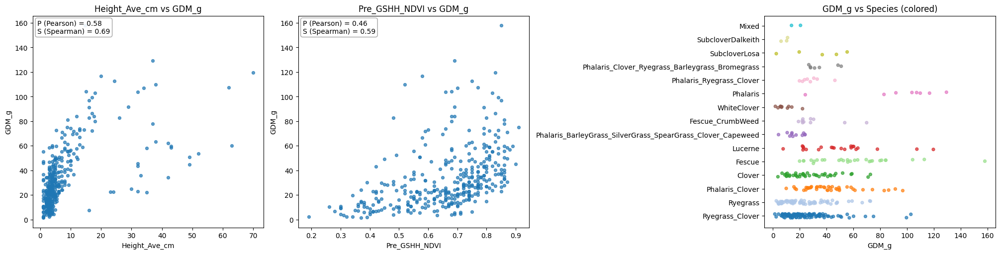

In [94]:
su.plot_target_vs_height_ndvi_species(full_df, target_col="GDM_g")

### Takeaways from **GDM_g** vs **Height**, **NDVI**, and **Species**

#### 1) **Height_Ave_cm vs GDM_g**

* **Clear positive relationship:** as height increases, **GDM_g generally increases**.
* **Spearman > Pearson (S=0.69 vs P=0.58)** → trend is **strongly monotonic but not perfectly linear** (MLP/nonlinear head helps vs pure linear).
* **Big spread at the same height (especially low–mid heights):** height explains a lot, but **density/coverage + species mix + capture conditions** still create variance.
* **Outliers at high height:** a few tall samples have only moderate GDM → possible **occlusion / sparse canopy / noisy labels / species-specific structure**.

#### 2) **Pre_GSHH_NDVI vs GDM_g**

* **Moderate positive association (P=0.46, S=0.59)** → NDVI is informative, but **weaker than height**.
* **Fan-shaped variance:** at higher NDVI (~0.7–0.9), GDM ranges from low to high → NDVI behaves like a **supporting signal**, not sufficient alone.
* **NDVI saturation effect:** many points cluster near high NDVI but with very different GDM → classic saturation in dense vegetation.

#### 3) **GDM_g vs Species (colored)**

* **Species clearly shifts the biomass range:** different species/groups occupy **different GDM bands** (some consistently higher/lower).
* **Within-species spread is still large:** species matters, but it’s **not the only driver**.
* **Different “GDM scales” per species:** strong hint you need **Height × Species** (and maybe **NDVI × Species**) interaction in the model.

### Modeling clues

* Use **species-aware modeling** (embedding or one-hot + interaction terms).
* Consider **`log1p(GDM_g)`** to reduce tail impact and stabilize training (rare high-GDM points are sparse but influential).
* **Height is the primary driver, NDVI is secondary, species is a key context variable.**


## Target **GDM_g** — consolidated observations — data prep and modeling clues

### Scoring Context

* **Critical Importance:** `GDM_g` has a weight of **0.2**, making it **important** for leaderboard movement, but secondary to `Dry_Total_g` (**0.5**) and above the 0.1-weight targets.


## 1. Data Preparation Recommendations

* **Target Transformation:** Train using `log1p(GDM_g)` to compress the **~0–160g** range. This reduces tail dominance (100–160g region), stabilizes gradients, and shifts focus from absolute to relative errors.

* **Selective Outlier Audit:** Inspect the top **1–2%** tail within each species (typically the **~100–160g** region). Rather than deleting, only **winsorize** (clip) samples that are confirmed harvest/entry/ROI errors.

* **Stratified Splitting:** Use **Species × Height-bin × NDVI-bin** for splits. Because tail density and height/NDVI coverage are species-dependent, random splitting can create unstable validation sets.

* **Tail Coverage Check:** Ensure the **largest GDM samples are not concentrated in a single split**. A simple check: take the top **1–2%** of `GDM_g` values and verify they appear across train/val/test.

* **Species Imbalance:** Prevent overfitting to “major species rules” by using a **WeightedRandomSampler** (inverse-frequency) or species-balanced sample weights in the loss function.


## 2. Modeling Hints

* **Mandatory Species Conditioning:** Integrate a **species embedding** with image features, NDVI, and height (e.g., `fused = [img_feat, height, ndvi, species_emb]`).

* **Feature Interactions:** Explicitly include interaction terms like `height * species_emb` and `ndvi * species_emb`. This lets the model represent that the same height/NDVI can map to different GDM levels across species.

* **Nonlinearity in the Fusion Head:** The relationship is monotonic but not perfectly linear (your plots show spread and curvature), so use a small **MLP fusion head** rather than a single linear layer.

* **Image Features Still Matter:** Height+NDVI are strong priors, but scatter indicates residual variation driven by texture/coverage/senescence. Let the CNN learn that residual structure.

* **Multi-task Synergy:** GDM behaves “total-mass-like” and often benefits from shared trunk training with `Dry_Total_g` / `Dry_Green_g` heads for stability.


## 3. Loss Function & Evaluation Alignment

* **Primary Loss:** Use **SmoothL1 (Huber)** on the `log1p(GDM_g)` target. This prevents rare high-gram samples from dominating gradients while still learning the full range.

* **Multitask Weighting:** Align your training loss with leaderboard scoring by weighting the total loss:

  $$L_{total} = 0.5 \cdot L_{dry_total} + 0.2 \cdot L_{gdm} + 0.1 \cdot (others...)$$

* **Tail-aware Weighting (Optional):** If `log1p` makes the model under-predict the upper tail, add a **mild capped value-based weight** for high-GDM samples (clipped to avoid instability) to keep the tail influential without letting it dominate.


# Step-by-step Data-prep checklist

## Step 0 — Context / Goal

| Item | Details |
|---|---|
| Targets covered | `Dry_Dead_g` (very right-skewed, weak relation with height/NDVI)<br>`Dry_Clover_g` (very right-skewed + many near-zeros, species effects)<br>`Dry_Green_g` (right-skewed but **strong** relation with height + decent NDVI)<br>`Dry_Total_g` (moderate-strong relation with height + some NDVI, heavy weight in metric)<br>`GDM_g` (similar to Dry_Green_g / Dry_Total_g patterns) |
| Objective | maximize weighted $R^2$ (prioritize Dry_Total_g=0.5, GDM_g=0.2) |

## Step 1 — Clean + validate rows (before any split)

| Sub-step | What to check | Rule / Condition | Action |
|---|---|---|---|
| 1.1 | Non-negativity | All biomass targets should be $\ge 0$ (`Dry_Dead_g`, `Dry_Green_g`, `Dry_Clover_g`, `Dry_Total_g`, `GDM_g`) | Decide drop vs clip |
| 1.2 | Sum-like sanity | If `Dry_Total_g` is supposed to be **sum-like**: `Dry_Total_g >= Dry_Green_g + Dry_Dead_g + Dry_Clover_g` (or close) | If violated heavily → likely label issue/outlier |
| 1.3 | Decision | If only a handful of bad rows | Drop those rows |
| 1.4 | Decision | If many bad rows | Clip negatives to 0 and keep (but log it) |

## Step 2 — Handle heavy skew + outliers

| Sub-step | What to do | How | Notes |
|---|---|---|---|
| 2.1 | Transform targets | For each target `y`: `y_t = log1p(y)` | compresses tail but preserves 0 |
| 2.2 | Why | Distributions have long right tails + many small values | Raw grams + MSE → huge values dominate gradients and hurt $R^2$ | Applies to all five targets |
| 2.3 | Winsorize extreme tail (before normalization stats) | In `log1p` space, cap at high percentile | Cap each target at `p99.5` (or `p99`) computed on **train only** |
| 2.4 | Optional debug flag | Keep indicator columns | `is_capped_<target>` | optional, can help debugging |

## Step 3 — Split strategy (species imbalance)

| Sub-step | What to do | How | Notes |
|---|---|---|---|
| 3.1 | Stratified split by `Species` | Ensure each split has similar species proportions | Random split can cause missing species in valid/test |
| 3.2 | Rare species handling | For rare species (count < ~5–10) | Option A (recommended): stratify on Species<br>Option B: group rare species into `"Other"` for stratification only (keep original label for model) | Practical workaround |
| 3.3 | Reproducibility | Fix `seed` and store split indices | Persist split indices | avoids leakage-like issues |

## Step 4 — Normalization (train-only statistics)

| Sub-step | What to do | How | Notes |
|---|---|---|---|
| 4.1 | Standardize each target separately | For each target `t`: `z = (y_t - mean_t) / std_t` | Compute `mean_t, std_t` on **train split only** |
| 4.2 | Save transform state | Save stats for inverse-transform and metrics | `state["stats"]` dict | Needed for training + evaluation |

## Step 5 — Inputs prep (what to feed the model)

| Input | Prep | How | Notes |
|---|---|---|---|
| NDVI | Standardize or keep raw | Standardize using train mean/std or keep as-is | NDVI bounded-ish (0.2–0.9) |
| NDVI outliers | Clamp if needed | Clamp to plausible range (e.g. [0,1]) | optional |
| Height | Stabilize tail | use `log1p(height)` **or** standardize raw height | recommended: `log1p(height)` then standardize |
| Species | Encode categorical | map to integer IDs (`species2id`) | embedding recommended |
| Species mapping | Consistency | keep mapping consistent across train/valid/test | mandatory |

## Step 6 — “Two-regime” hint for Dead/Clover (prep that helps modeling)

| Sub-step | What to add | How | Use |
|---|---|---|---|
| 6.1 | Binary indicators | `dead_present = 1[Dry_Dead_g > 0]`<br>`clover_present = 1[Dry_Clover_g > 0]` | Derived from labels, used only during training |
| 6.2 | Optional usage | Auxiliary head or analysis | Train classification head, or use for stratification/hard-case analysis | Helps choose robust loss |

## Step 7 — Image preprocessing (keep it stable)

| Sub-step | What | Recommendation |
|---|---|---|
| 7.1 | Base preprocessing | resize + ImageNet normalization (already good) |
| 7.2 | Safe augmentations | mild color jitter, small random crop/resize, horizontal flip (if spatial meaning isn’t broken) |
| 7.3 | Avoid | aggressive geometric warps that distort scale/texture too much |

## Step 8 — Final prep pipeline order (copy this order)

| Order | Step |
|---:|---|
| 1 | Load dataframe |
| 2 | Basic cleaning: nulls, negatives, impossible combos |
| 3 | Split into train/valid/test (stratified by species) |
| 4 | Compute train-only caps in `log1p` space (optional) |
| 5 | Transform targets: `log1p` → cap → standardize (train stats) |
| 6 | Transform inputs: NDVI standardize, height `log1p`+standardize |
| 7 | Encode species to IDs |
| 8 | Save `state = {stats, caps, species2id, input_norms, target_cfg}` |
| 9 | Build datasets/dataloaders |

## Step 9 — Strong recommendation (competition metric)

| Item | Details |
|---|---|
| Priority targets | `Dry_Total_g` (0.5) and `GDM_g` (0.2) |
| Non-negotiable prep | `log1p` + cap + robust loss |
| Rationale | stabilize learning for most heavily weighted targets |

| Optional follow-up | Details |
|---|---|
| If you paste `prepare_data()` | I can rewrite it into a clean version implementing train-only stats, caps, mappings, and returning `state` |
